**Load Data**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Linha corrigida
df = pd.read_csv('dataset/44.csv', sep=';')
#df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/44.csv')
#first description of the data
df.head()

,time_stamp,asset_id,id,train_test,status_type_id,sensor_0_avg,sensor_0_max,sensor_0_min,sensor_0_std,sensor_1_avg,...,wind_speed_236_min,wind_speed_236_std,wind_speed_235_avg,wind_speed_235_max,wind_speed_235_min,wind_speed_235_std,wind_speed_237_avg,wind_speed_237_max,wind_speed_237_min,wind_speed_237_std
0,2022-08-02 14:00:00,44,0,train,0,22.026,27.6,15.3,2.381,0.0044,...,3.85,0.7347,6.607,9.9,3.1,0.8705,6.813,10.1,2.7,0.9747
1,2022-08-02 14:10:00,44,1,train,0,21.170,25.7,15.3,1.947,-0.0125,...,3.70,0.7355,6.416,9.3,2.2,0.8920,6.618,9.6,2.8,0.9180
2,2022-08-02 14:20:00,44,2,train,0,18.990,25.3,13.0,2.928,0.0117,...,3.70,0.8943,6.174,10.7,2.4,0.9950,6.600,10.3,2.8,1.0780
3,2022-08-02 14:30:00,44,3,train,0,18.048,24.7,13.0,1.875,-0.0098,...,3.70,0.6885,5.925,8.2,2.4,0.7651,6.227,8.9,2.1,0.9643
4,2022-08-02 14:40:00,44,4,train,0,19.077,25.0,13.6,2.287,0.0056,...,2.80,0.7453,6.443,9.8,2.4,0.8538,6.608,9.6,1.0,0.9440


In [2]:
# Get the column names
column_names = df.columns.tolist()

# Print the column names
#column_names

# Split the Data in Months and Year

In [3]:
# Converter coluna de data para datetime
df['Date'] = pd.to_datetime(df['time_stamp'], format="%Y-%m-%d %H:%M:%S")

# Criar coluna de meses contínuos
start_date = df['Date'].min()
df['Month'] = (df['Date'].dt.year - start_date.year) * 12 + df['Date'].dt.month - start_date.month + 1

# Extrair também o ano, se quiser manter
df['Year'] = df['Date'].dt.year 

# Renomear a coluna de média de potência
df.rename(columns={'power_5_avg': 'LV ActivePower (kW)'}, inplace=True)

# Selecionar apenas colunas relevantes
new_data = df[['Month', 'Year', 'Date', 'LV ActivePower (kW)', 'wind_speed_235_avg']]

# Calcular a capacidade máxima
cap = new_data['LV ActivePower (kW)'].max()

# Visualizar dados
new_data


#cap

,Month,Year,Date,LV ActivePower (kW),wind_speed_235_avg
0,1,2022,2022-08-02 14:00:00,0.25032,6.607
1,1,2022,2022-08-02 14:10:00,0.24058,6.416
2,1,2022,2022-08-02 14:20:00,0.21610,6.174
3,1,2022,2022-08-02 14:30:00,0.20514,5.925
4,1,2022,2022-08-02 14:40:00,0.21706,6.443
...,...,...,...,...,...
62998,15,2023,2023-10-14 01:40:00,0.48766,7.669
62999,15,2023,2023-10-14 01:50:00,0.42062,7.277
63000,15,2023,2023-10-14 02:00:00,0.49204,7.746
63001,15,2023,2023-10-14 02:10:00,0.49202,7.678


# Null Values

In [4]:
new_data.describe()

,Month,Year,Date,LV ActivePower (kW),wind_speed_235_avg
count,63003.000000,63003.000000,63003,63003.000000,63003.000000
mean,7.745869,2022.653921,2023-03-09 08:10:00,0.359844,7.509023
min,1.000000,2022.000000,2022-08-02 14:00:00,-0.015779,0.000000
25%,4.000000,2022.000000,2022-11-19 23:05:00,0.051448,4.808500
50%,8.000000,2023.000000,2023-03-09 08:10:00,0.248880,6.657000
75%,11.000000,2023.000000,2023-06-26 17:15:00,0.634600,9.655500
max,15.000000,2023.000000,2023-10-14 02:20:00,1.029600,28.878000
std,4.166814,0.475722,NaN,0.341922,3.983525


In [5]:
new_data.isnull().sum()

Month                  0
Year                   0
Date                   0
LV ActivePower (kW)    0
wind_speed_235_avg     0
dtype: int64

# Visualization

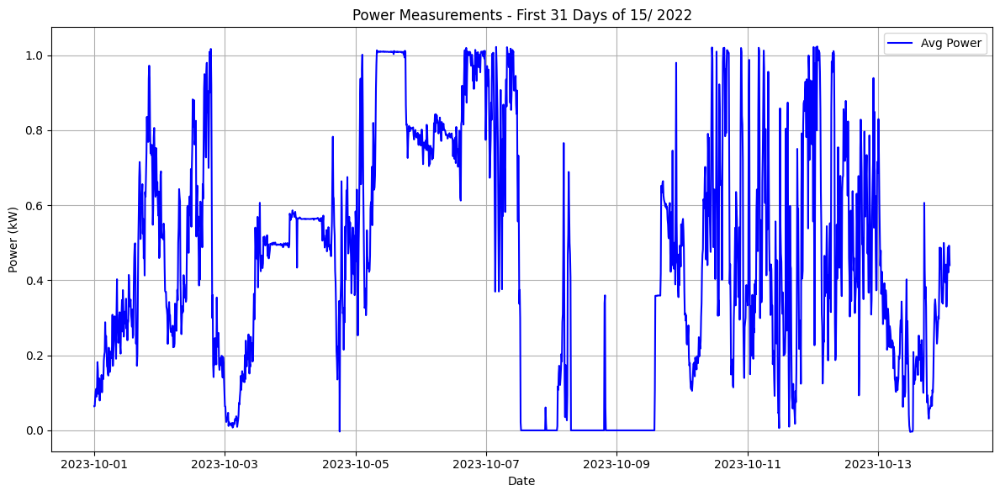

In [6]:
import matplotlib.pyplot as plt

# Parâmetros
month = 15
year = 2022
num_days = 31 # Altere aqui a quantidade de dias desejada

# Filtro base: mês e ano
filtered_data = new_data[(new_data['Month'] == month)]

# Pega os primeiros N dias únicos
first_n_days = filtered_data['Date'].dt.date.unique()[:num_days]

# Filtra apenas os dados desses dias
plot_data = filtered_data[filtered_data['Date'].dt.date.isin(first_n_days)]

# Plotando
plt.figure(figsize=(12, 6))

#plt.plot(plot_data['Date'], plot_data['power_5_min'], label='Min Power', color='red', linestyle='--')
plt.plot(plot_data['Date'], plot_data['LV ActivePower (kW)'], label='Avg Power', color='blue')
#plt.plot(plot_data['Date'], plot_data['power_5_max'], label='Max Power', color='green', linestyle='--')

# Personalização
plt.title(f'Power Measurements - First {num_days} Days of {month}/ {year}')
plt.xlabel('Date')
plt.ylabel('Power (kW)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

**Parameter Settings**

In [7]:
i=[1,2,3] #enter month value, i.e January = 1
look_back=6
data_partition=0.8

In [8]:
'''!pip install EMD-signal
!pip install tensorflow_docs
!pip install ewtpy
!pip install optuna'''

'!pip install EMD-signal\n!pip install tensorflow_docs\n!pip install ewtpy\n!pip install optuna'

In [9]:
from myfunctions import svr_model, svr_model_optuna, ann_model,ann_model_optuna,ann_quantile_model_with_rri, rf_model,rf_model_optuna,lstm_model,bilstm_model,bilstm_att_model,cnn_bilstm_att_model, emd_lstm,eemd_lstm,ceemdan_lstm,proposed_method,cnn_bilstm_model,cnn_bilstm_model_with_optuna,cnn_bilstm_att_model_with_optuna

2025-09-25 17:21:17.907911: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-25 17:21:17.990270: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2025-09-25 17:21:18.345085: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-09-25 17:21:18.345325: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-09-25 17:21:18.427017: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to

In [10]:
from myfunctions import proposed_method_bilstm,proposed_method_bilstm_att,proposed_method_cnn_bilstm,proposed_method_cnn_bilstm_att, transformer_model,tft_model,lstm_model_with_optuna,bilstm_att_model_with_optuna,bilstm_model_with_optuna 

In [11]:
from myfunctions import proposed_method_bilstm_att_optuna, proposed_method_bilstm_optuna,proposed_method_tft_aggregator, proposed_method_lstm_optuna,proposed_method_cnn_bilstm_att_optuna

In [12]:
CUDA_VISIBLE_DEVICES=""

Horizonte t+1: MAPE=2.5117, RMSE=0.0411, MAE=0.0259, R²=0.8111
Horizonte t+2: MAPE=3.0978, RMSE=0.0477, MAE=0.0319, R²=0.7461
Horizonte t+3: MAPE=3.4422, RMSE=0.0514, MAE=0.0354, R²=0.7046


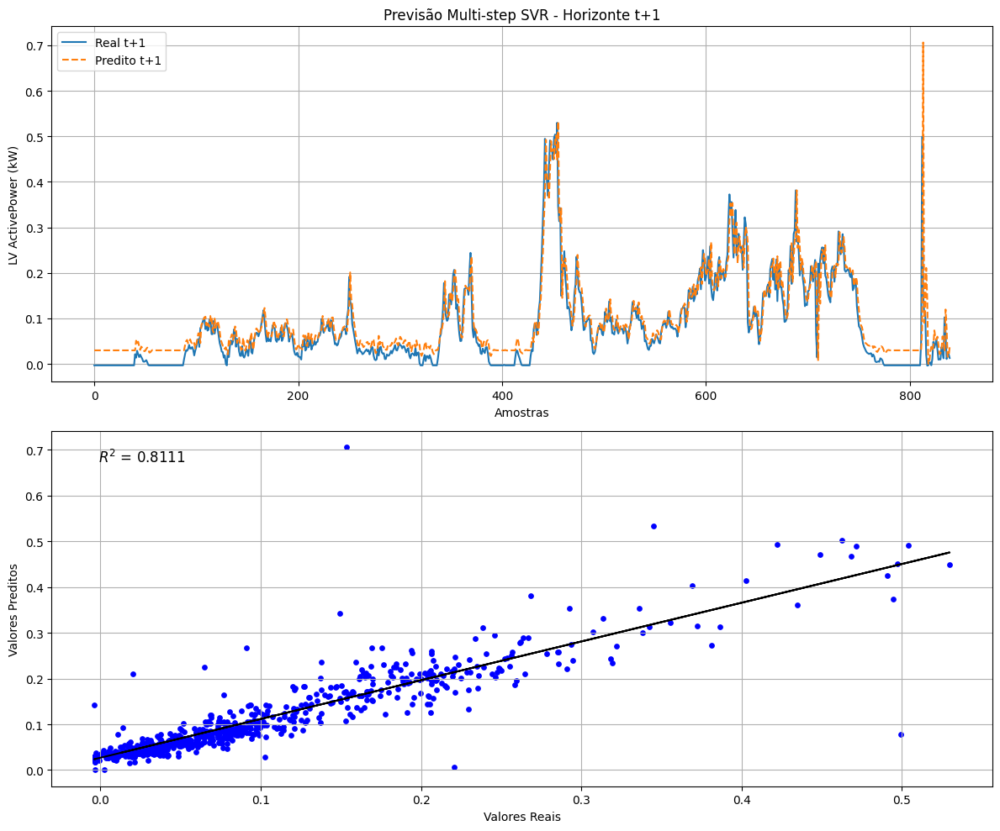

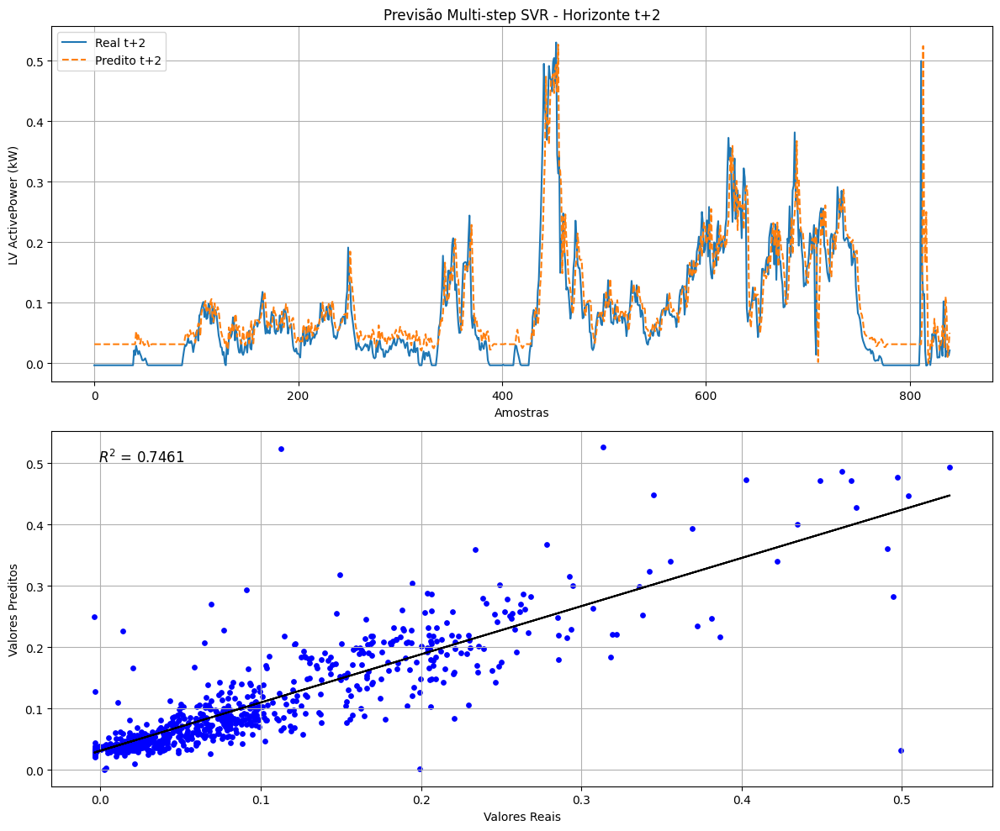

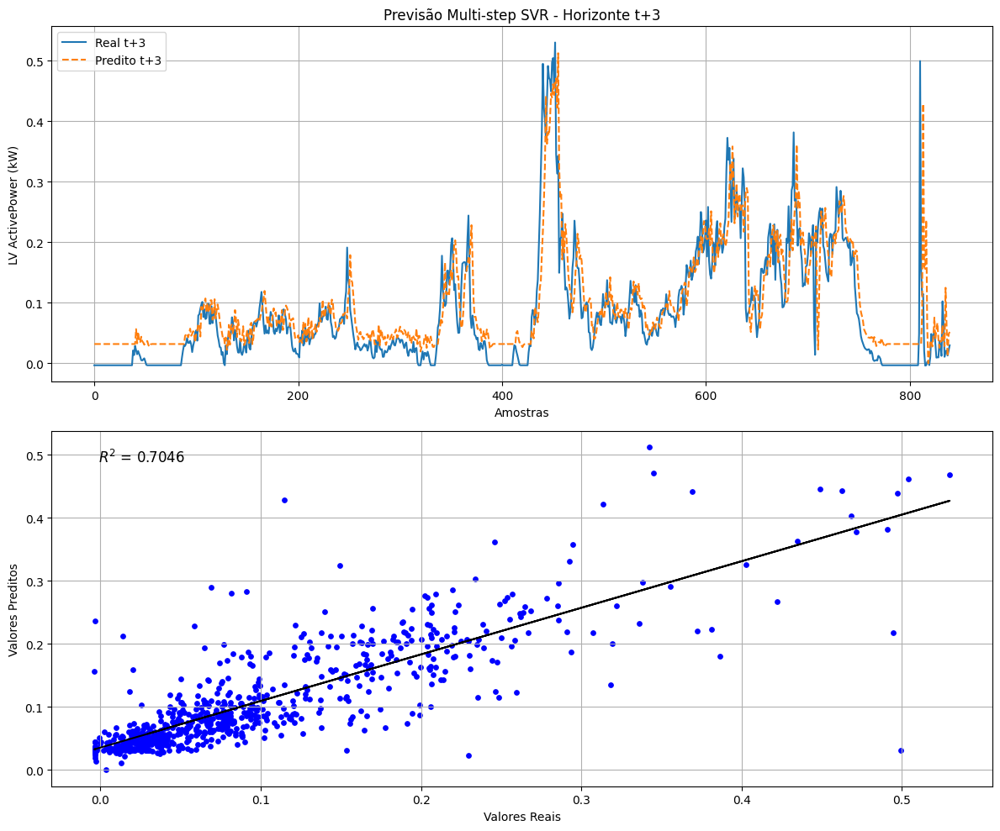

In [13]:
svr_model(new_data,i,look_back,data_partition,cap)

[I 2025-09-09 23:36:23,322] A new study created in memory with name: no-name-9cddea96-132d-4b9b-bb94-0db948e0a183


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-09 23:36:23,602] Trial 3 finished with value: 17.812733771842346 and parameters: {'C': 0.5366888664330852, 'epsilon': 0.40377211961927484, 'gamma': 'auto'}. Best is trial 3 with value: 17.812733771842346.
[I 2025-09-09 23:36:23,712] Trial 5 finished with value: 16.104433765315928 and parameters: {'C': 0.6752228186323326, 'epsilon': 0.2486362305677046, 'gamma': 'auto'}. Best is trial 5 with value: 16.104433765315928.
[I 2025-09-09 23:36:23,731] Trial 0 finished with value: 16.015393598325204 and parameters: {'C': 0.20782574639171666, 'epsilon': 0.2095725389329079, 'gamma': 'auto'}. Best is trial 0 with value: 16.015393598325204.
[I 2025-09-09 23:36:23,878] Trial 4 finished with value: 17.13884175075309 and parameters: {'C': 26.828003120645278, 'epsilon': 0.3597585136629575, 'gamma': 'scale'}. Best is trial 0 with value: 16.015393598325204.
[I 2025-09-09 23:36:24,274] Trial 1 finished with value: 15.06755746324417 and parameters: {'C': 29.750457261826213, 'epsilon': 0.16776576

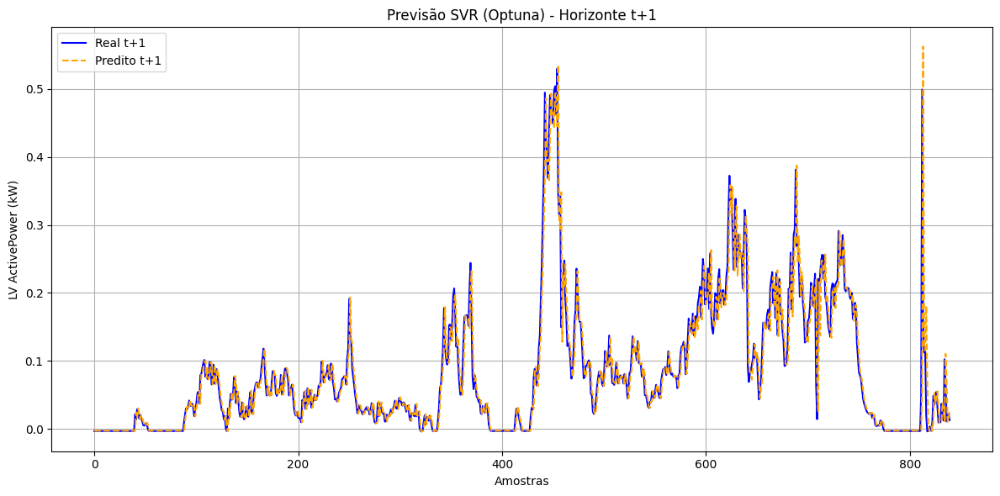

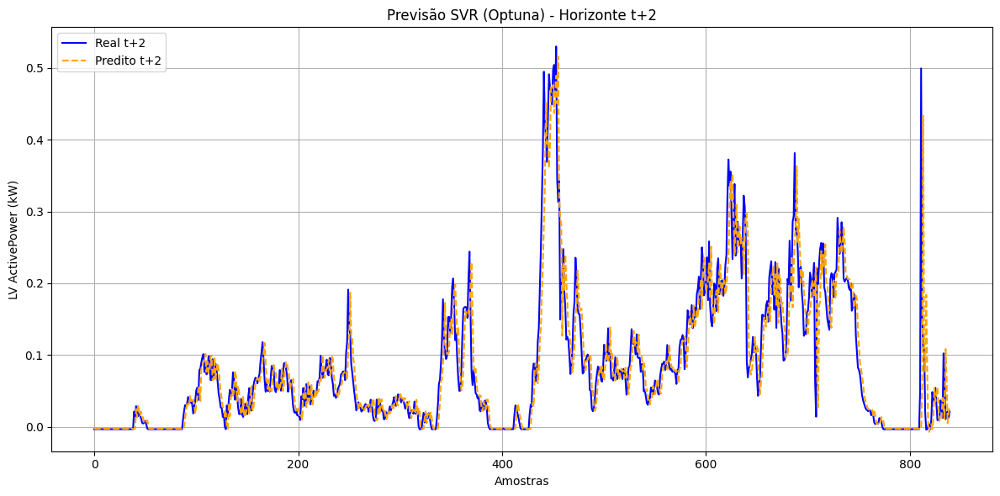

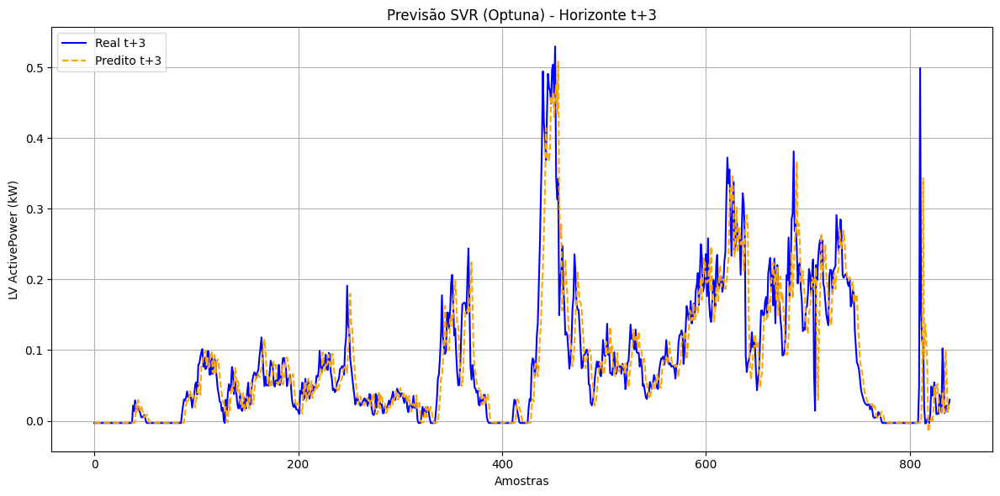

(MultiOutputRegressor(estimator=SVR(C=11.278020813490954,
                                    epsilon=0.0011558586656778785,
                                    gamma='auto')),
 {'C': 11.278020813490954, 'epsilon': 0.0011558586656778785, 'gamma': 'auto'},
 ([1.6565072660094307, 2.29317848980401, 2.6844080350262],
  [0.03525080164147403, 0.042972026590092506, 0.04803832299004387],
  [0.017055398810833098, 0.023610565731022087, 0.027638665128629756],
  2.211364596946547,
  0.04208705040720347,
  0.022768209890161647))

In [13]:
svr_model_optuna(new_data,i,look_back,data_partition,cap)

27/27 [==============================] - 0s 1ms/step

===== Métricas por horizonte =====
t+1 -> MAPE: 2.2984 | RMSE: 0.0414 | MAE: 0.0237
t+2 -> MAPE: 3.9388 | RMSE: 0.0557 | MAE: 0.0406
t+3 -> MAPE: 5.3318 | RMSE: 0.0674 | MAE: 0.0549

===== Médias =====
MAPE médio: 3.8563 | RMSE médio: 0.0548 | MAE médio: 0.0397


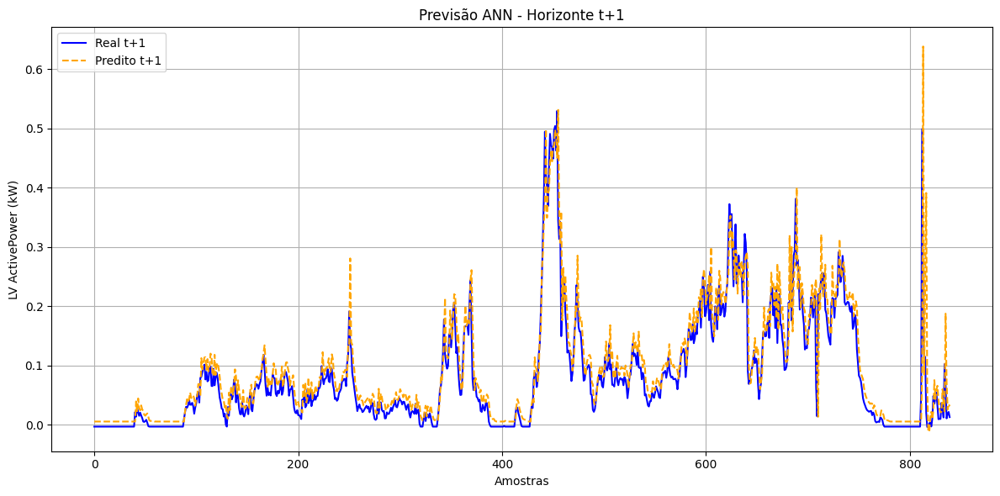

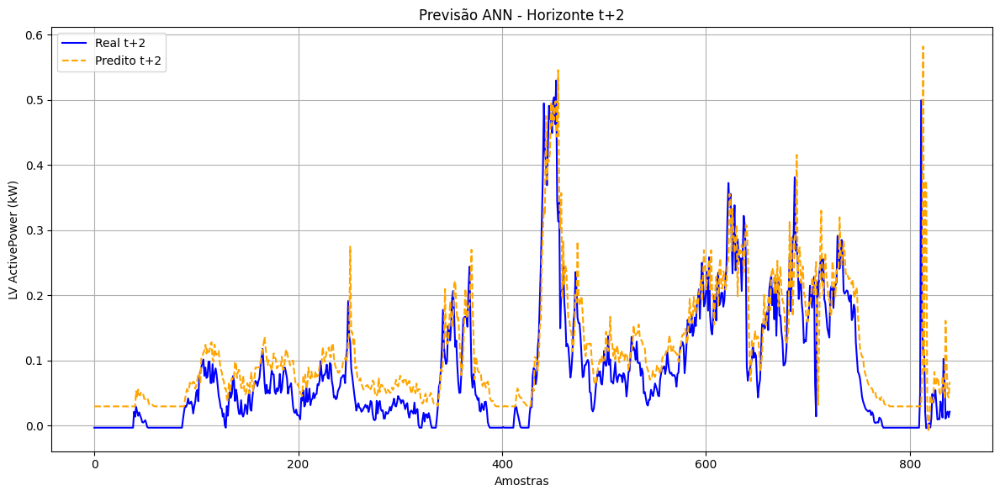

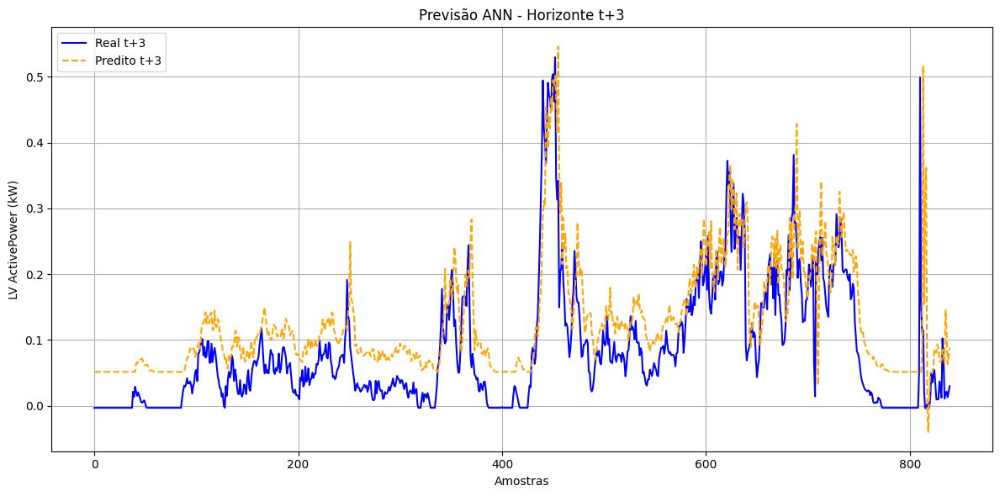

(<keras.src.engine.sequential.Sequential at 0x7ec207c6bf70>,
 ([2.2983652441540117, 3.938808831201235, 5.331843133938517],
  [0.041396734093922145, 0.05574275862242503, 0.0674004396749913],
  [0.023663968553809703, 0.04055397572604792, 0.054896656907030966],
  3.8563390697645885,
  0.054846644130446154,
  0.039704867062296194))

In [14]:
ann_model(new_data,i,look_back,data_partition,cap)

--- EXECUTANDO EM MODO DE TREINAMENTO ---
Treinando modelo para o quantil: 0.1
82/82 [==============================] - 0s 1ms/step
Modelo salvo em: saved_models/ann_quantile/model_q01.keras
Treinando modelo para o quantil: 0.5
82/82 [==============================] - 0s 1ms/step
Modelo salvo em: saved_models/ann_quantile/model_q05.keras
Treinando modelo para o quantil: 0.9
82/82 [==============================] - 0s 1ms/step
Modelo salvo em: saved_models/ann_quantile/model_q09.keras
Scalers salvos com sucesso.

===== Métricas Completas (baseadas na previsão da mediana q=0.5) =====
Horizonte t+10: MAPE=3.9636%, RMSE=0.0682, MAE=0.0408, R²=0.9603
Horizonte t+20: MAPE=5.2331%, RMSE=0.0912, MAE=0.0539, R²=0.9291
Horizonte t+30: MAPE=6.2205%, RMSE=0.1029, MAE=0.0640, R²=0.9097


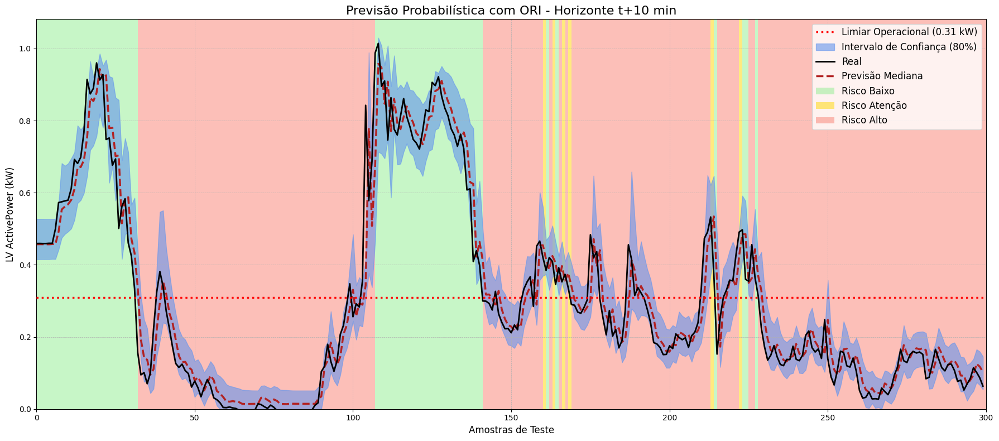

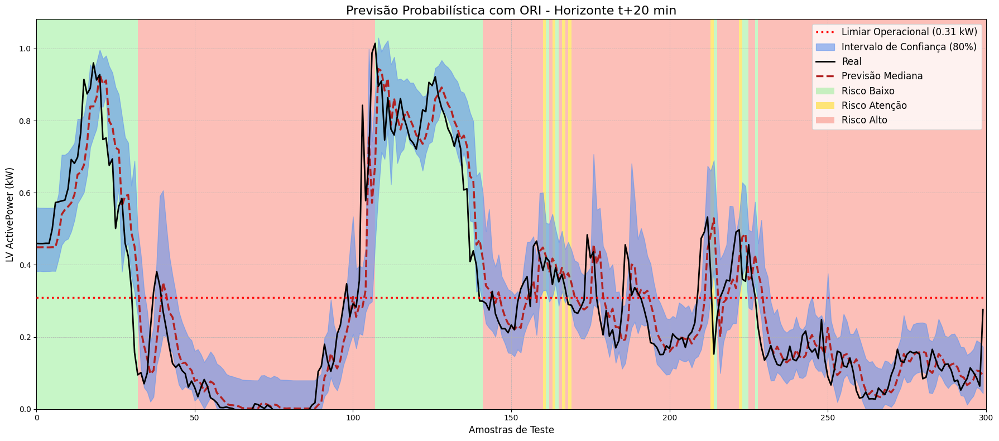

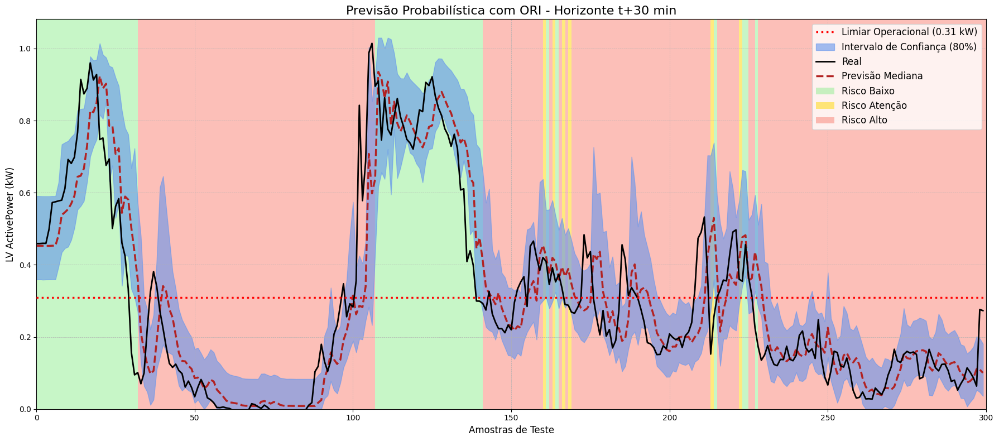

({0.1: array([[0.41521853, 0.38186455, 0.35897803],
         [0.41566154, 0.38265887, 0.35953835],
         [0.4156359 , 0.38181603, 0.35857388],
         ...,
         [0.4203446 , 0.39859727, 0.36369464],
         [0.40410224, 0.37028182, 0.34393924],
         [0.37940055, 0.34628177, 0.3313048 ]], dtype=float32),
  0.5: array([[0.45679682, 0.44860953, 0.45281458],
         [0.45706144, 0.44852033, 0.4528608 ],
         [0.456967  , 0.4487576 , 0.45282987],
         ...,
         [0.53577185, 0.53378755, 0.5292224 ],
         [0.47321883, 0.46920192, 0.47332284],
         [0.42920515, 0.43208882, 0.42478073]], dtype=float32),
  0.9: array([[0.5274274 , 0.5588084 , 0.5906587 ],
         [0.5268548 , 0.5581332 , 0.5902885 ],
         [0.5266445 , 0.5579939 , 0.5899322 ],
         ...,
         [0.6485868 , 0.7315434 , 0.77117693],
         [0.5389184 , 0.57413244, 0.60709953],
         [0.5244371 , 0.5646393 , 0.5883802 ]], dtype=float32)},
 array([[0.45906, 0.45924, 0.45894],
        

In [12]:
ann_quantile_model_with_rri(new_data,i,look_back,data_partition,cap)

[I 2025-09-09 23:37:44,251] A new study created in memory with name: no-name-352b5326-f341-4363-8f3b-70f6f82b7fbf


  0%|          | 0/30 [00:00<?, ?it/s]

[I 2025-09-09 23:38:34,991] Trial 2 finished with value: 7.8079885592419265 and parameters: {'neurons': 64, 'dropout_rate': 0.22739485940254323, 'batch_size': 64}. Best is trial 2 with value: 7.8079885592419265.
[I 2025-09-09 23:38:38,478] Trial 6 finished with value: 8.122014399123524 and parameters: {'neurons': 64, 'dropout_rate': 0.41186123093426114, 'batch_size': 32}. Best is trial 2 with value: 7.8079885592419265.
[I 2025-09-09 23:38:41,527] Trial 4 finished with value: 10.629947089045018 and parameters: {'neurons': 32, 'dropout_rate': 0.457819236979137, 'batch_size': 32}. Best is trial 2 with value: 7.8079885592419265.
[I 2025-09-09 23:38:43,992] Trial 3 finished with value: 7.6510661871643135 and parameters: {'neurons': 128, 'dropout_rate': 0.06658322706678715, 'batch_size': 32}. Best is trial 3 with value: 7.6510661871643135.
[I 2025-09-09 23:38:46,784] Trial 5 finished with value: 8.632531013070937 and parameters: {'neurons': 32, 'dropout_rate': 0.16647745499052424, 'batch_siz

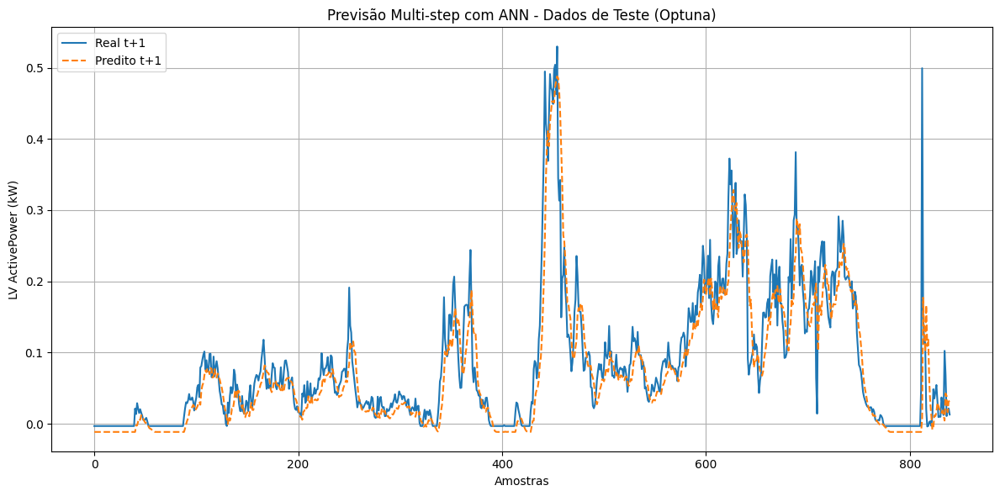

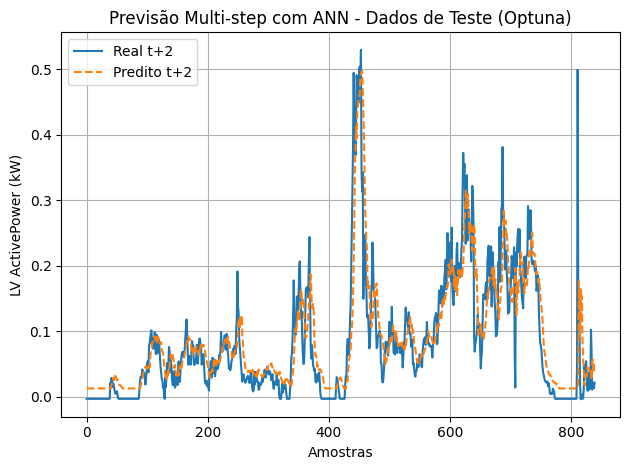

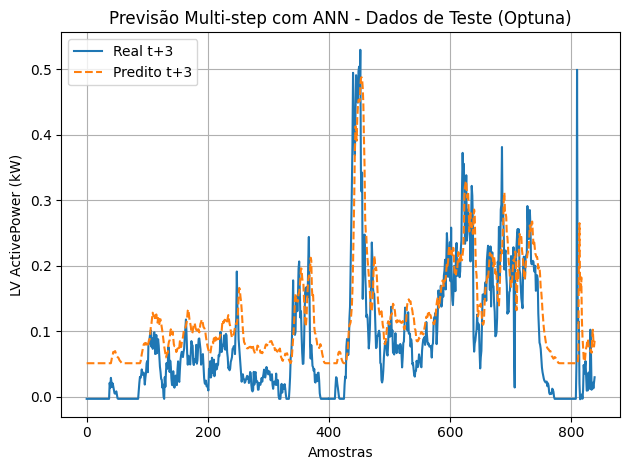

(<keras.src.engine.sequential.Sequential at 0x7ec14f9b2b00>,
 <optuna.study.study.Study at 0x7ec1845e4d60>)

In [15]:
ann_model_optuna(new_data,i,look_back,data_partition,cap)

In [1]:
rf_model(new_data,i,look_back,data_partition,cap)

NameError: name 'rf_model' is not defined

[I 2025-09-09 23:50:11,262] A new study created in memory with name: no-name-26038c31-d525-4c17-b639-c0cdadbe5530


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2025-09-09 23:50:12,692] Trial 0 finished with value: 11.541498067602928 and parameters: {'n_estimators': 179, 'max_depth': 17, 'min_samples_split': 10, 'min_samples_leaf': 2}. Best is trial 0 with value: 11.541498067602928.
[I 2025-09-09 23:50:14,256] Trial 1 finished with value: 11.605399654607615 and parameters: {'n_estimators': 190, 'max_depth': 19, 'min_samples_split': 4, 'min_samples_leaf': 2}. Best is trial 0 with value: 11.541498067602928.
[I 2025-09-09 23:50:15,699] Trial 2 finished with value: 11.513292355665293 and parameters: {'n_estimators': 217, 'max_depth': 5, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 2 with value: 11.513292355665293.
[I 2025-09-09 23:50:17,646] Trial 3 finished with value: 11.414129738631637 and parameters: {'n_estimators': 208, 'max_depth': 8, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 3 with value: 11.414129738631637.
[I 2025-09-09 23:50:18,527] Trial 4 finished with value: 11.371485926747253 and parameters: {

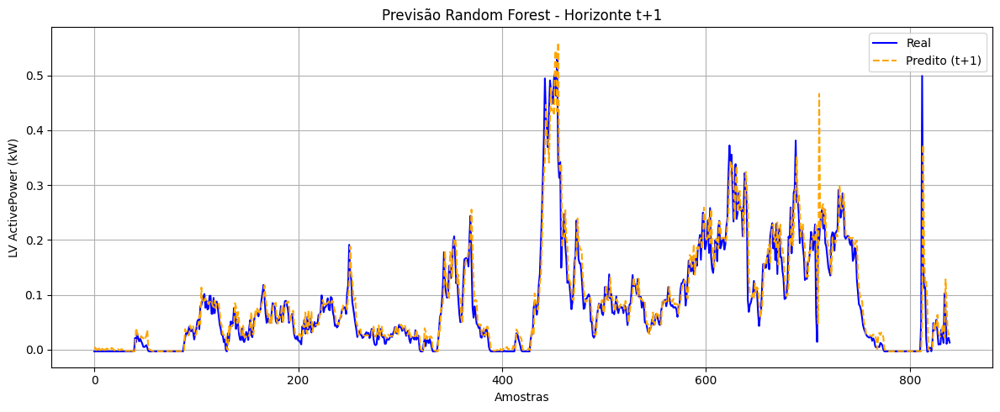


Horizonte t+2:
  MAPE: 2.6450
  RMSE: 0.0452
  MAE: 0.0272


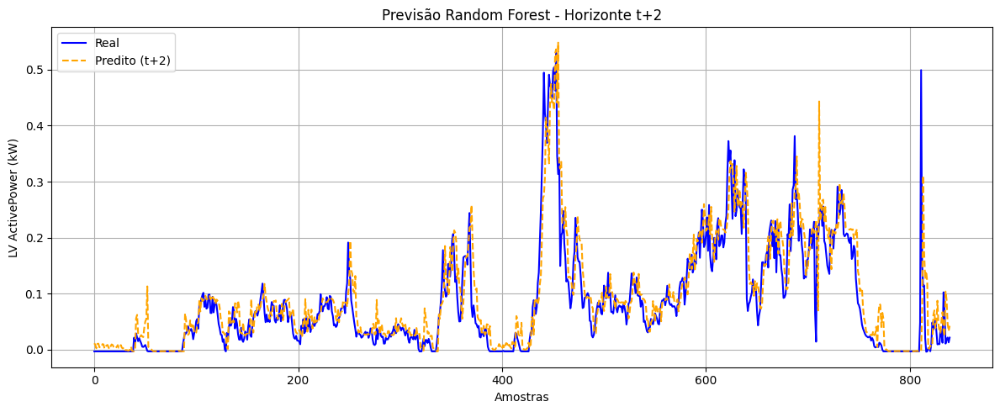


Horizonte t+3:
  MAPE: 3.2848
  RMSE: 0.0532
  MAE: 0.0338


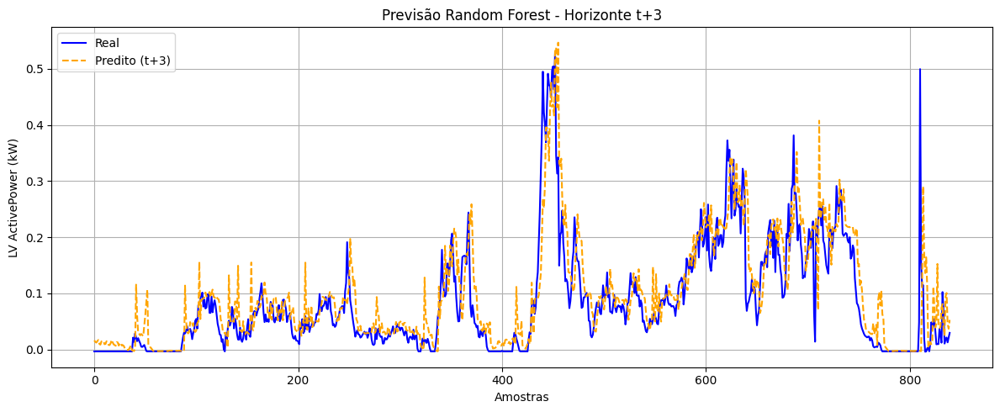

(RandomForestRegressor(max_depth=7, min_samples_leaf=4, min_samples_split=5,
                       n_estimators=213, n_jobs=-1, random_state=1234),
 array([[ 0.00143569,  0.01134993,  0.01635491],
        [ 0.00377942,  0.00861399,  0.01373914],
        [-0.00093264,  0.00236869,  0.01251157],
        ...,
        [ 0.03440719,  0.046736  ,  0.04611906],
        [ 0.02751228,  0.03329794,  0.03716007],
        [ 0.0300529 ,  0.04236319,  0.05283812]]),
 array([[-0.003196 , -0.0032   , -0.0031856],
        [-0.0032   , -0.0031856, -0.0032   ],
        [-0.0031856, -0.0032   , -0.0031938],
        ...,
        [ 0.018353 ,  0.02154  ,  0.012863 ],
        [ 0.02154  ,  0.012863 ,  0.021424 ],
        [ 0.012863 ,  0.021424 ,  0.0298   ]]))

In [17]:
rf_model_optuna(new_data,i,look_back,data_partition,cap)

82/82 [==============================] - 0s 1ms/step
Horizonte t+1: MAPE=4.1483, RMSE=0.0683, MAE=0.0427
Horizonte t+2: MAPE=5.6496, RMSE=0.0911, MAE=0.0582
Horizonte t+3: MAPE=6.5348, RMSE=0.1025, MAE=0.0673


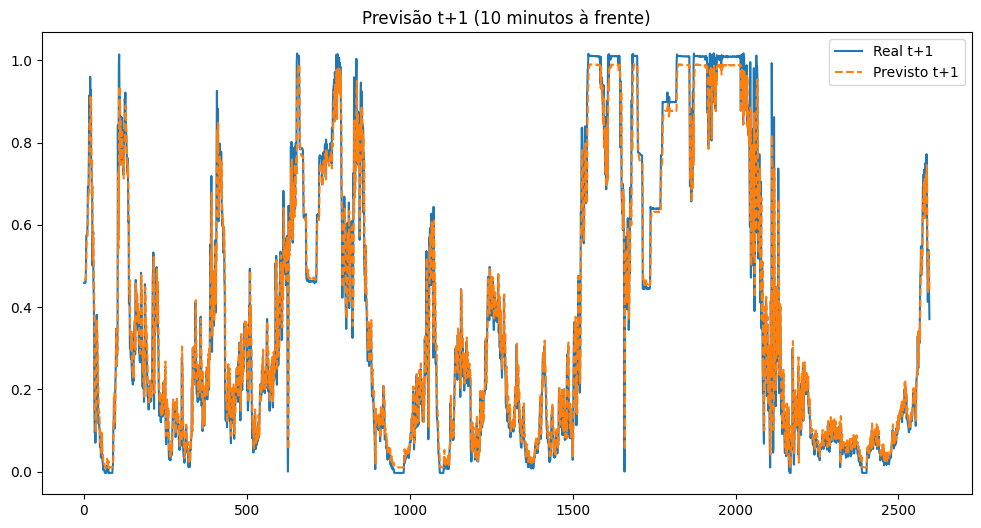

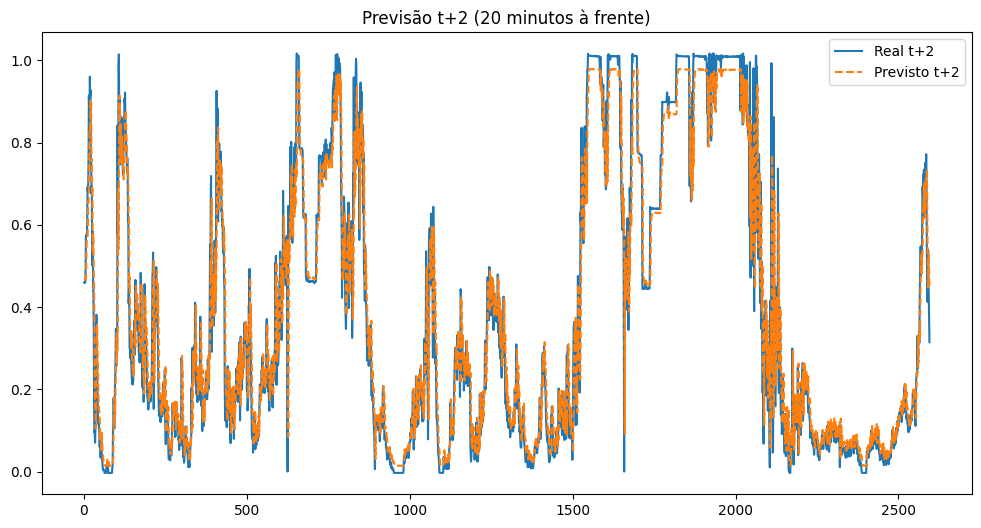

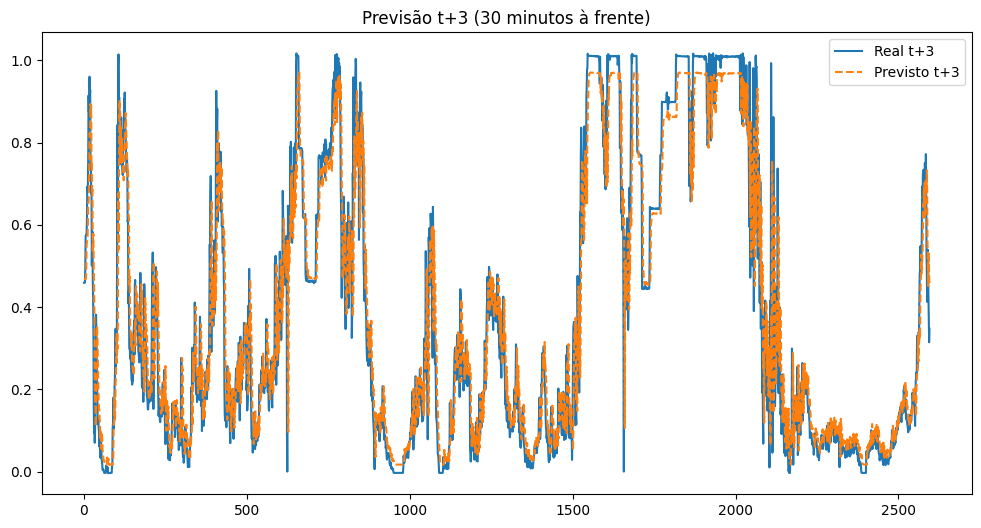

In [13]:
lstm_model(new_data,i,look_back,data_partition,cap)

[I 2025-09-09 23:57:58,495] A new study created in memory with name: no-name-28019a46-ae39-4b71-9659-42916974dc62


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2025-09-09 23:59:05,539] Trial 5 finished with value: 8.434892180390106 and parameters: {'neuron': 64, 'dropout': 0.27305862470857095, 'lr': 0.0047682174040079885, 'batch_size': 32}. Best is trial 5 with value: 8.434892180390106.
[I 2025-09-09 23:59:44,662] Trial 3 finished with value: 9.407823737525801 and parameters: {'neuron': 32, 'dropout': 0.3188490980736038, 'lr': 0.0014959450205418745, 'batch_size': 64}. Best is trial 5 with value: 8.434892180390106.
[I 2025-09-10 00:00:11,697] Trial 0 finished with value: 8.126642434486447 and parameters: {'neuron': 16, 'dropout': 0.010660504140974358, 'lr': 0.0020116696531591654, 'batch_size': 32}. Best is trial 0 with value: 8.126642434486447.
[I 2025-09-10 00:00:20,299] Trial 2 finished with value: 9.062369072243035 and parameters: {'neuron': 64, 'dropout': 0.4811847277034654, 'lr': 0.0008212284815011307, 'batch_size': 64}. Best is trial 0 with value: 8.126642434486447.
[I 2025-09-10 00:01:35,404] Trial 8 finished with value: 8.7816700042

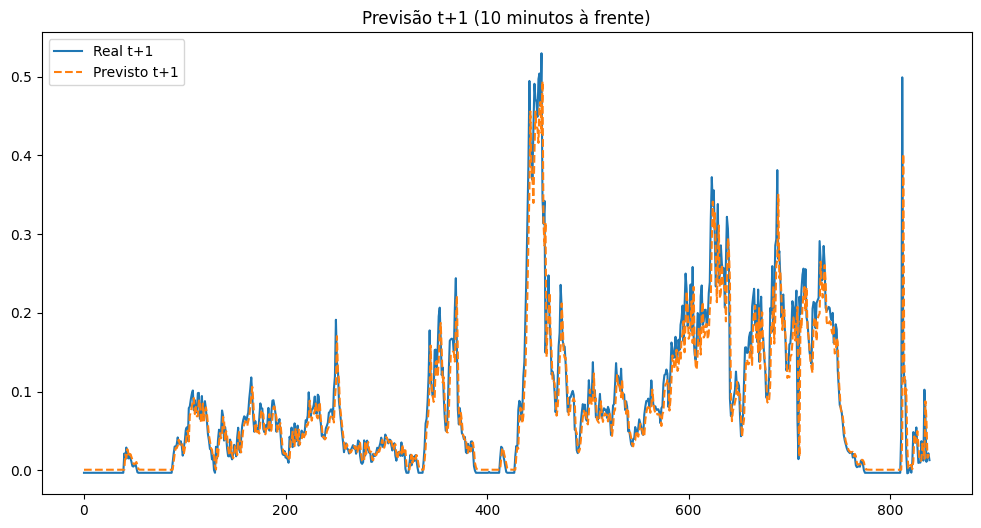

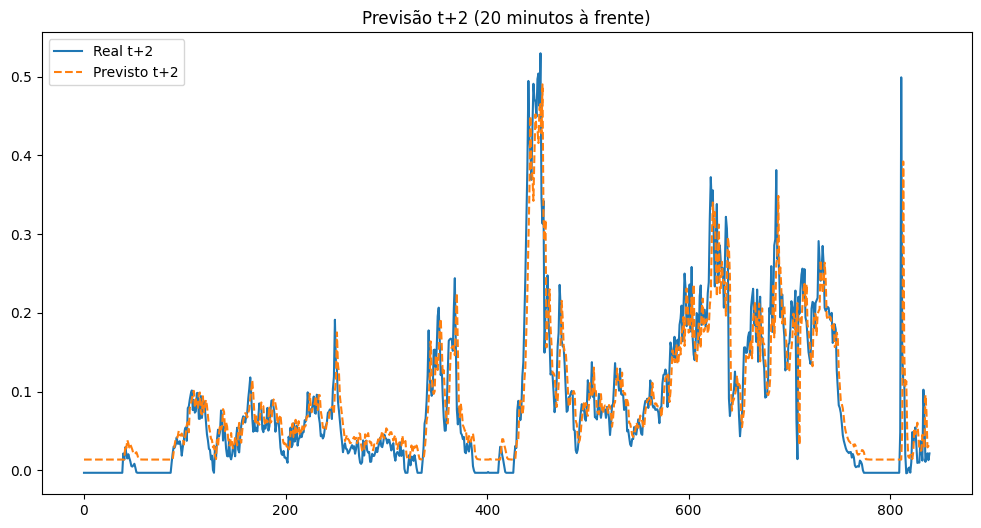

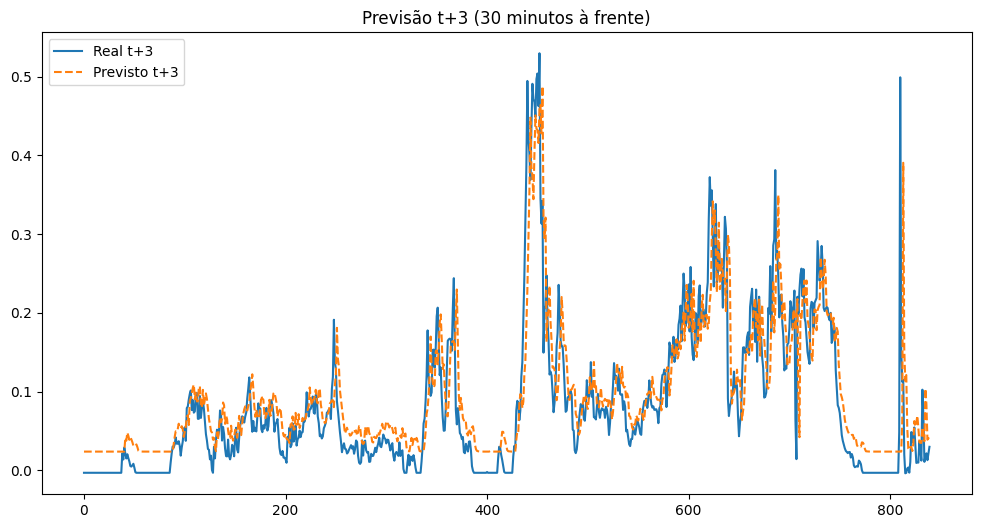

{'Metrics': {'Horizonte t+1': {'MAPE': 1.7726799204253931,
   'RMSE': 0.03374614561966996,
   'MAE': 0.018251512460699847},
  'Horizonte t+2': {'MAPE': 2.598264726310874,
   'RMSE': 0.04235036128726886,
   'MAE': 0.026751733622096763},
  'Horizonte t+3': {'MAPE': 3.321604585320243,
   'RMSE': 0.04936589630388368,
   'MAE': 0.03419924081045723}},
 'Best Params': {'neuron': 16,
  'dropout': 0.4175904091136385,
  'lr': 0.009483903843230288,
  'batch_size': 32}}

In [13]:
lstm_model_with_optuna(new_data,i,look_back,data_partition,cap)

27/27 [==============================] - 0s 2ms/step
Horizonte t+1: MAPE=2.3962, RMSE=0.0370, MAE=0.0247
Horizonte t+2: MAPE=3.2791, RMSE=0.0473, MAE=0.0338
Horizonte t+3: MAPE=3.9366, RMSE=0.0544, MAE=0.0405


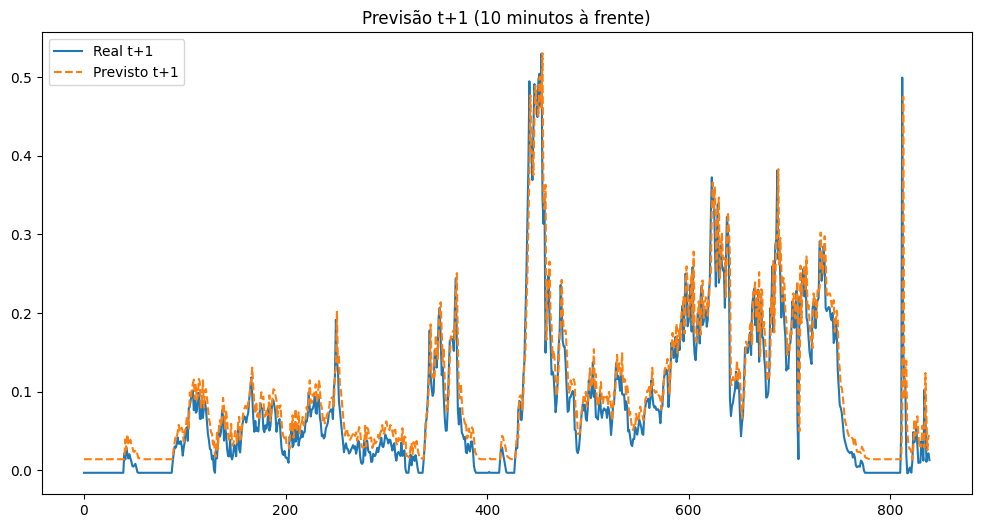

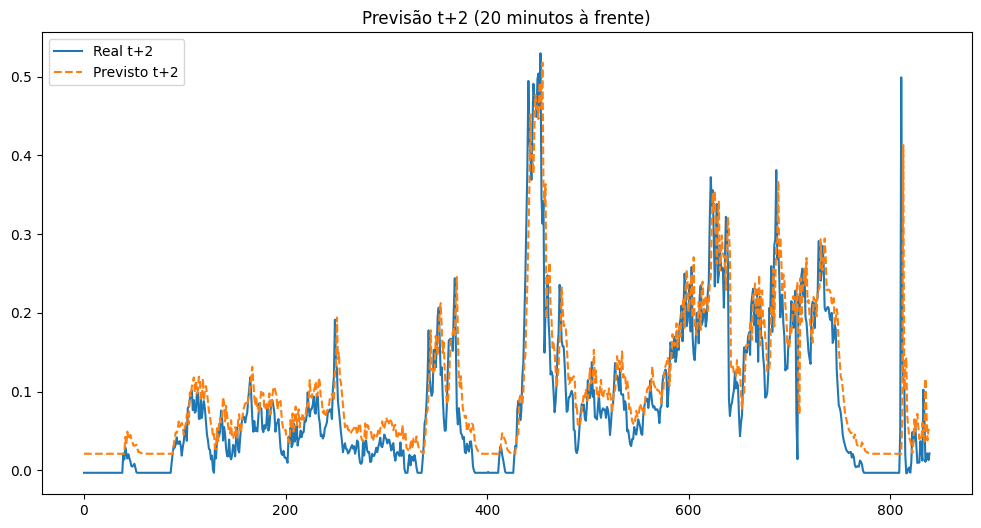

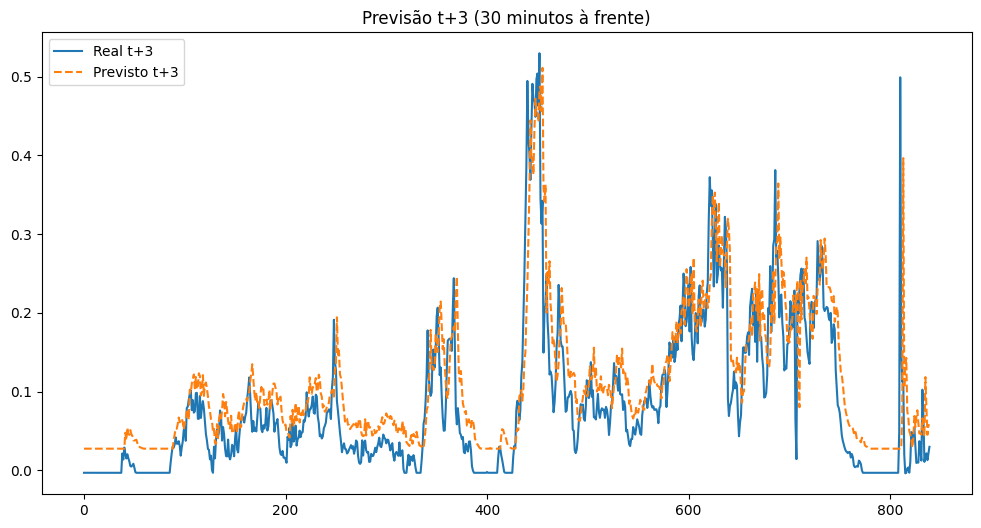

In [12]:
bilstm_model(new_data,i,look_back,data_partition,cap)

[I 2025-09-10 00:15:28,499] A new study created in memory with name: no-name-341fd172-8d7e-4305-a4fa-587673bb0722


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2025-09-10 00:17:43,606] Trial 5 finished with value: 7.910878495178689 and parameters: {'neuron': 64, 'dropout': 0.43982942824257787, 'lr': 0.0036660635030005455, 'batch_size': 16}. Best is trial 5 with value: 7.910878495178689.
[I 2025-09-10 00:18:04,193] Trial 1 finished with value: 9.155425735433148 and parameters: {'neuron': 128, 'dropout': 0.3031467210639883, 'lr': 0.001567590766579141, 'batch_size': 16}. Best is trial 5 with value: 7.910878495178689.
[I 2025-09-10 00:18:09,713] Trial 2 finished with value: 9.840293582300307 and parameters: {'neuron': 128, 'dropout': 0.4758628956831594, 'lr': 0.0004996025919899328, 'batch_size': 64}. Best is trial 5 with value: 7.910878495178689.
[I 2025-09-10 00:18:41,187] Trial 0 finished with value: 11.576743408159794 and parameters: {'neuron': 16, 'dropout': 0.029921616594957456, 'lr': 0.0006925553270158424, 'batch_size': 64}. Best is trial 5 with value: 7.910878495178689.
[I 2025-09-10 00:19:26,557] Trial 4 finished with value: 10.6514714

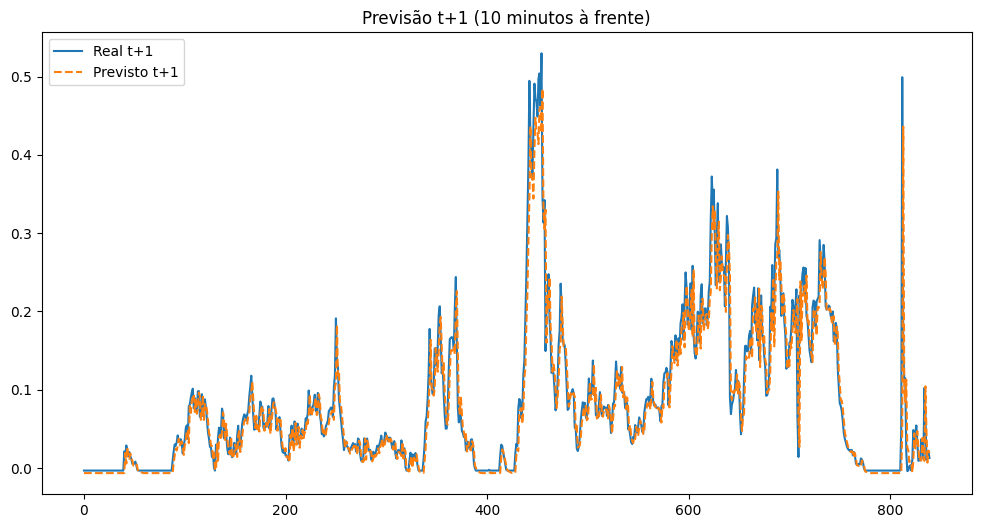

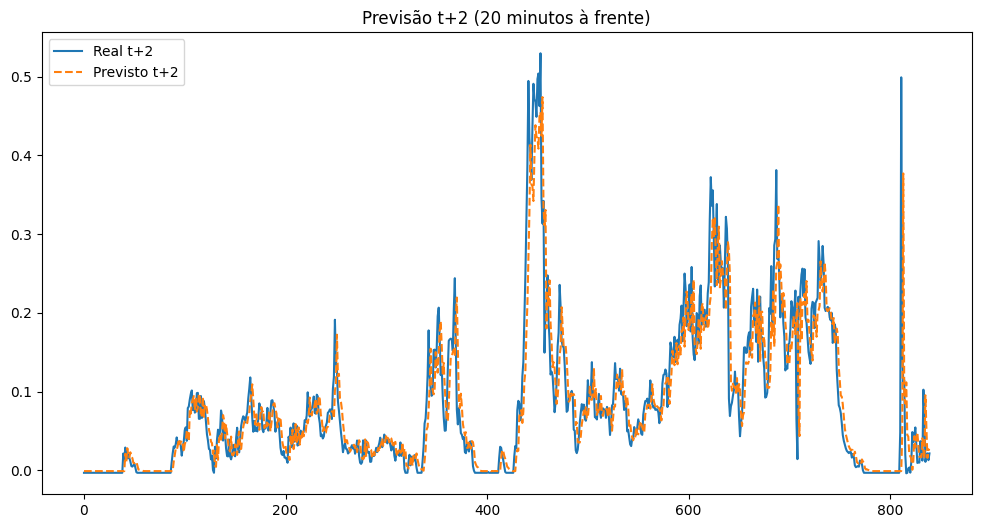

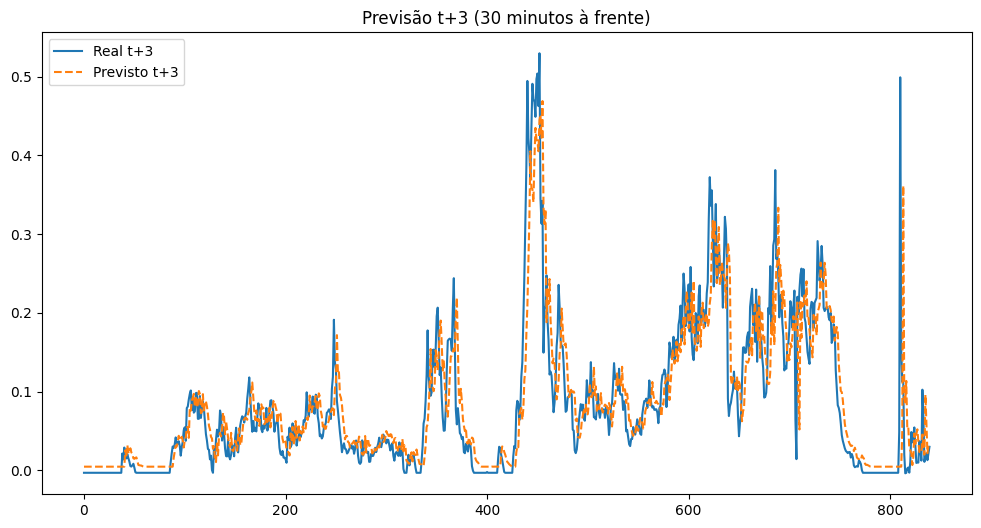

{'Metrics': {'Horizonte t+1': {'MAPE': 1.699411940915178,
   'RMSE': 0.03337586744257643,
   'MAE': 0.017497145343662673},
  'Horizonte t+2': {'MAPE': 2.3270379840476285,
   'RMSE': 0.04206389003192279,
   'MAE': 0.023959183083754387},
  'Horizonte t+3': {'MAPE': 2.8350340469071638,
   'RMSE': 0.04773934208560513,
   'MAE': 0.02918951054695616}},
 'Best Params': {'neuron': 64,
  'dropout': 0.3871074830960058,
  'lr': 0.008860294107199622,
  'batch_size': 32}}

In [13]:
bilstm_model_with_optuna(new_data,i,look_back,data_partition,cap)

27/27 [==============================] - 1s 2ms/step
Horizonte t+1: MAPE=2.4186, RMSE=0.0375, MAE=0.0249
Horizonte t+2: MAPE=3.3549, RMSE=0.0479, MAE=0.0345
Horizonte t+3: MAPE=3.9476, RMSE=0.0555, MAE=0.0406


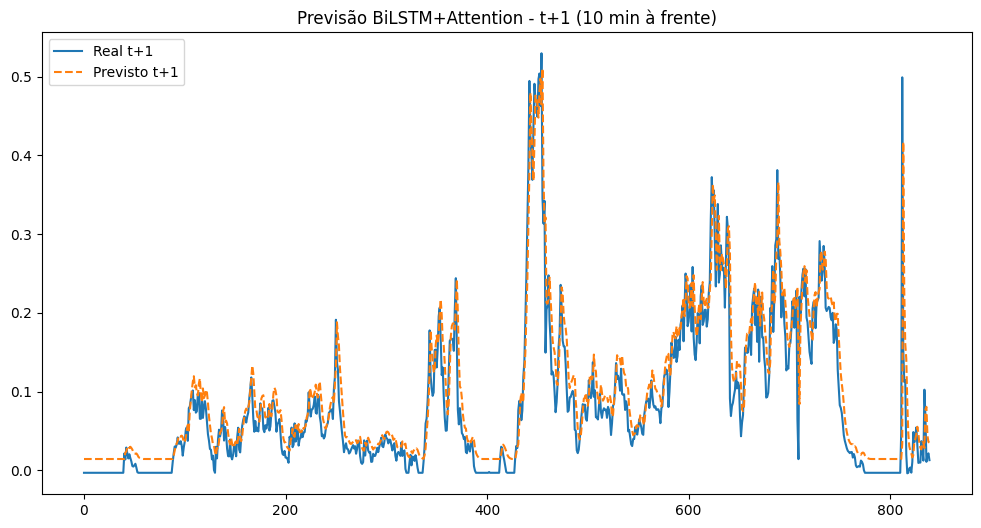

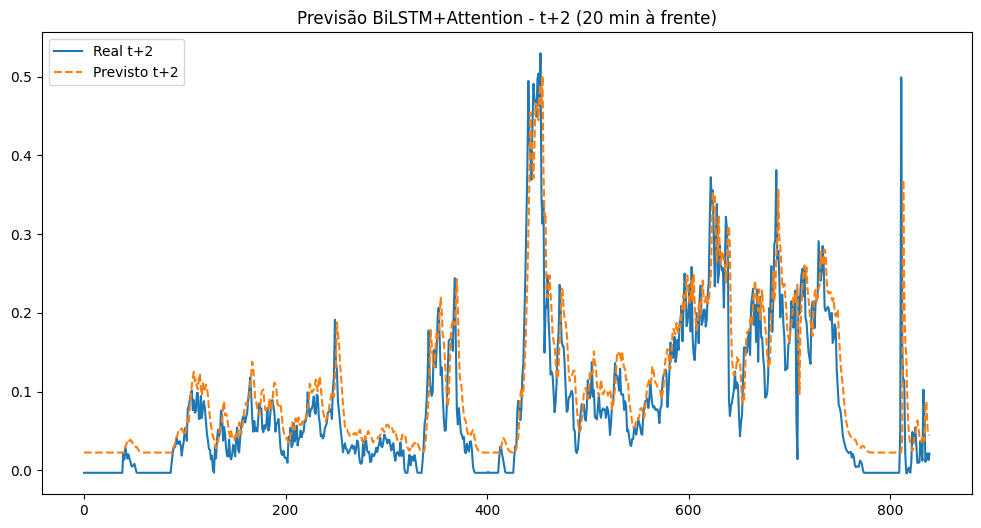

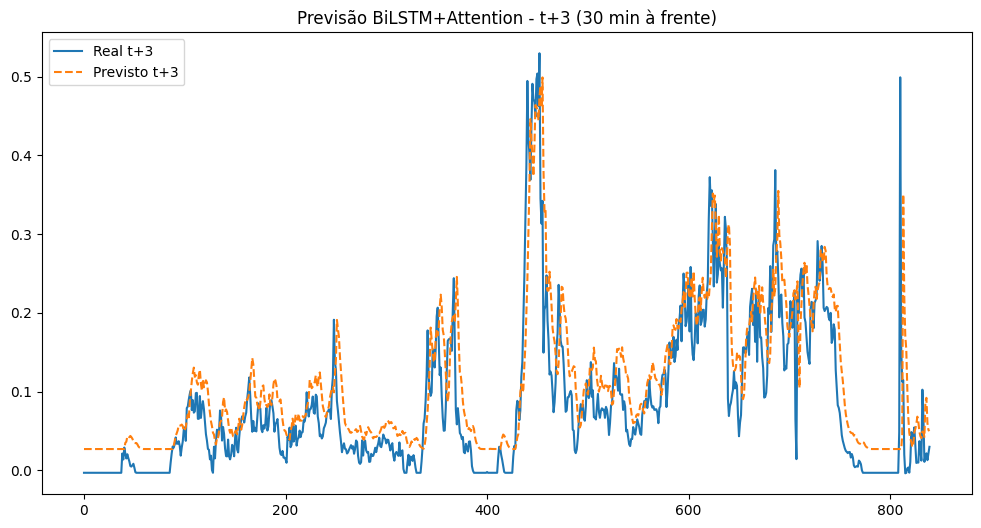

In [20]:
bilstm_att_model(new_data,i,look_back,data_partition,cap)

In [ ]:
bilstm_att_model_with_optuna(new_data,i,look_back,data_partition,cap)

[I 2025-09-10 09:30:29,612] A new study created in memory with name: no-name-66ded55f-e354-4199-801a-f8428aa1d3d1


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2025-09-10 09:33:52,336] Trial 2 finished with value: 8.985728513999879 and parameters: {'neuron': 64, 'dropout': 0.360776958074578, 'lr': 0.0064259437787493575, 'batch_size': 64}. Best is trial 2 with value: 8.985728513999879.
[I 2025-09-10 09:35:18,080] Trial 0 finished with value: 10.666973086971034 and parameters: {'neuron': 64, 'dropout': 0.14651586010434797, 'lr': 0.0008872575010980295, 'batch_size': 32}. Best is trial 2 with value: 8.985728513999879.
[I 2025-09-10 09:35:25,301] Trial 1 finished with value: 9.19218569759815 and parameters: {'neuron': 64, 'dropout': 0.41616564293544234, 'lr': 0.0022243052648759573, 'batch_size': 16}. Best is trial 2 with value: 8.985728513999879.
[I 2025-09-10 09:35:48,087] Trial 3 finished with value: 10.71484898256773 and parameters: {'neuron': 32, 'dropout': 0.4157428811362119, 'lr': 0.002463177341043669, 'batch_size': 32}. Best is trial 2 with value: 8.985728513999879.
[I 2025-09-10 09:36:43,838] Trial 4 finished with value: 9.0062603302794

27/27 [==============================] - 0s 3ms/step
Horizonte t+1: MAPE=3.3632, RMSE=0.0426, MAE=0.0346
Horizonte t+2: MAPE=4.4116, RMSE=0.0543, MAE=0.0454
Horizonte t+3: MAPE=5.2745, RMSE=0.0639, MAE=0.0543


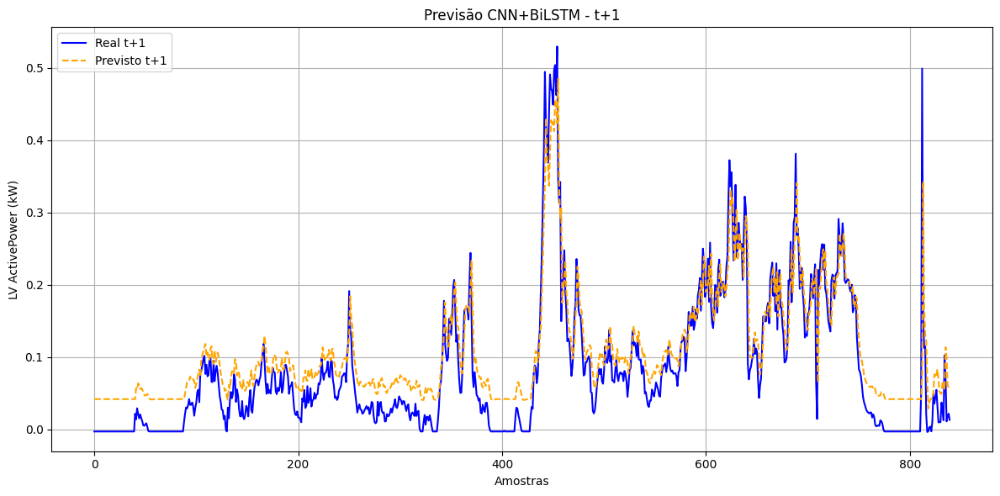

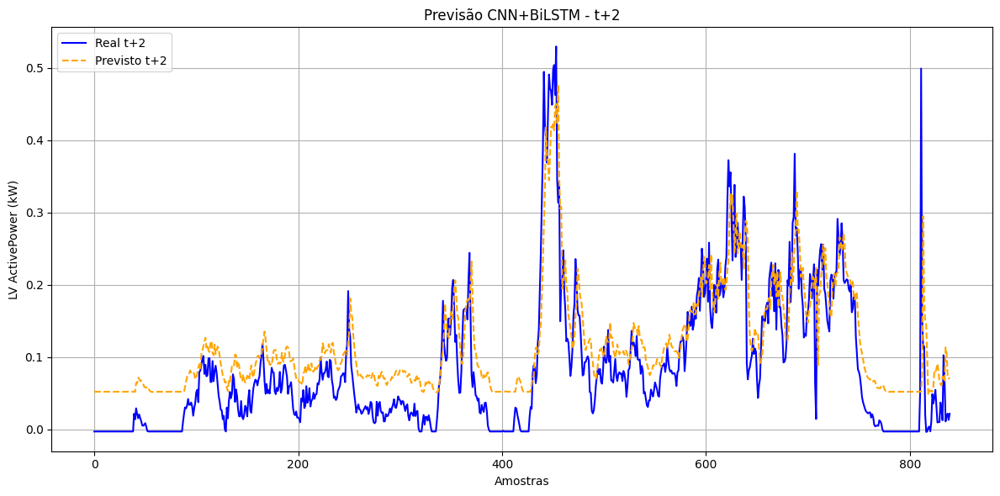

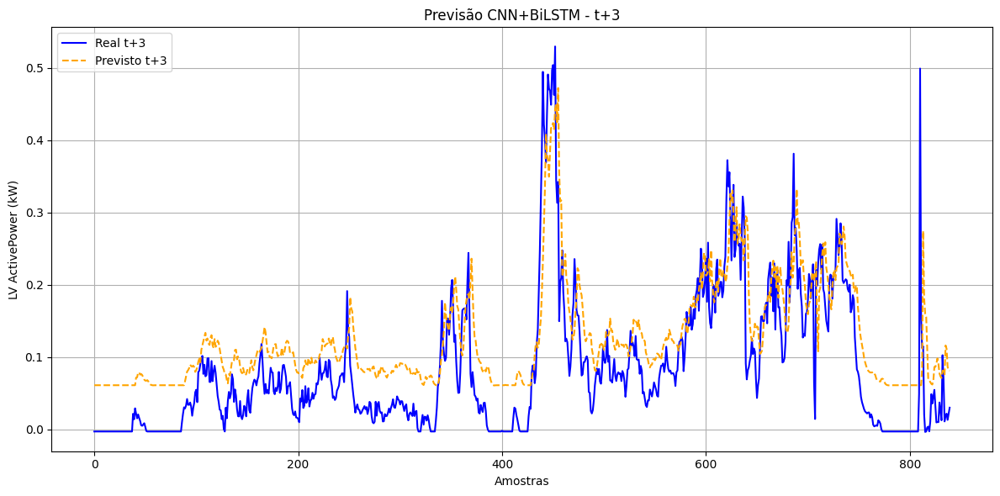

{'Horizonte t+1': {'MAPE': 3.3631672705114477,
  'RMSE': 0.04256978398080162,
  'MAE': 0.034627170217185865},
 'Horizonte t+2': {'MAPE': 4.411593712342854,
  'RMSE': 0.05425165076904622,
  'MAE': 0.045421768862282025},
 'Horizonte t+3': {'MAPE': 5.27449077479418,
  'RMSE': 0.06388593655837212,
  'MAE': 0.05430615701728087}}

In [12]:
cnn_bilstm_model(new_data,i,look_back,data_partition,cap)

[I 2025-09-10 09:47:17,129] A new study created in memory with name: no-name-ff843090-b700-4fb1-ac5d-b3b3279eac45


  0%|          | 0/30 [00:00<?, ?it/s]

27/27 [==============================] - 3s 14ms/step
[I 2025-09-10 09:49:25,379] Trial 4 finished with value: 8.708719299382567 and parameters: {'filters': 16, 'kernel_size': 2, 'neuron': 64, 'dropout': 0.38093710552440324, 'lr': 0.0045591848776775365, 'batch_size': 64}. Best is trial 4 with value: 8.708719299382567.
27/27 [==============================] - 3s 12ms/step
[I 2025-09-10 09:49:38,594] Trial 3 finished with value: 8.759551142235159 and parameters: {'filters': 64, 'kernel_size': 5, 'neuron': 16, 'dropout': 0.1246915377220349, 'lr': 0.002825928359315868, 'batch_size': 64}. Best is trial 4 with value: 8.708719299382567.
27/27 [==============================] - 6s 32ms/step
[I 2025-09-10 09:49:47,982] Trial 2 finished with value: 9.396980348787201 and parameters: {'filters': 64, 'kernel_size': 5, 'neuron': 16, 'dropout': 0.03612670589003969, 'lr': 0.00847544997235719, 'batch_size': 32}. Best is trial 4 with value: 8.708719299382567.
27/27 [==============================] - 3s 

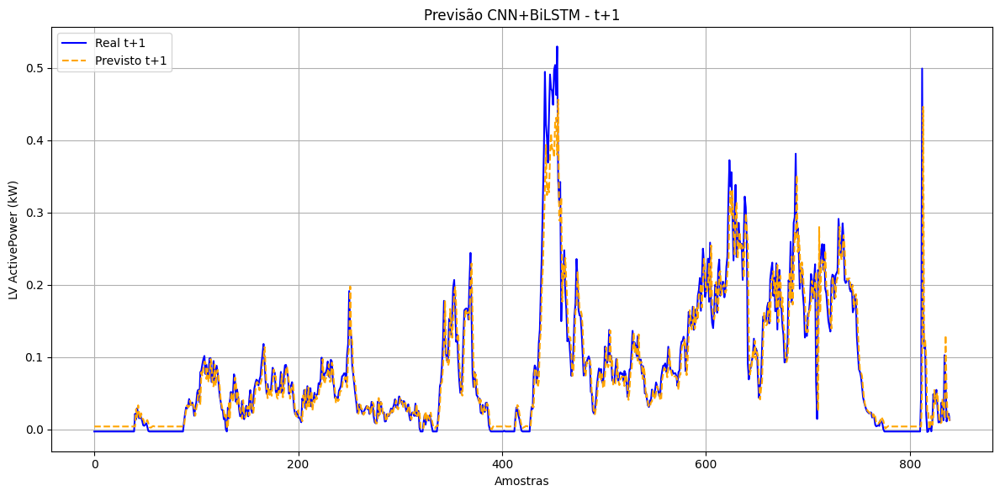

Horizonte t+2: MAPE=2.4731, RMSE=0.0424, MAE=0.0255


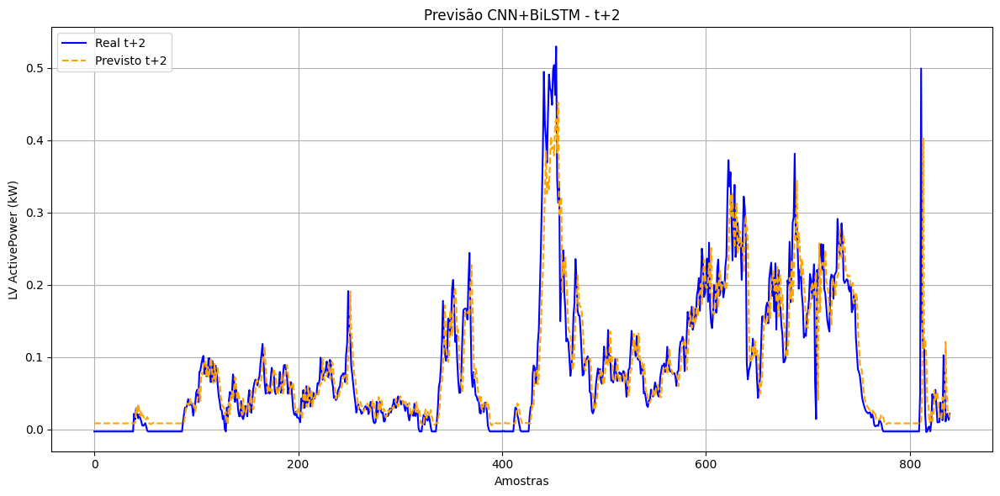

Horizonte t+3: MAPE=2.9790, RMSE=0.0483, MAE=0.0307


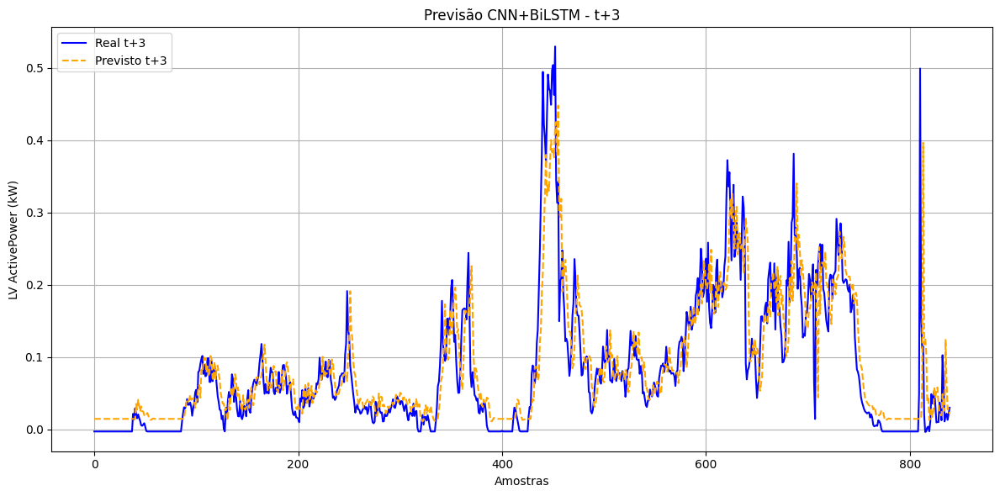

{'Resultados': {'Horizonte t+1': {'MAPE': 1.791366084514098,
   'RMSE': 0.034051905463282565,
   'MAE': 0.018443905206157154},
  'Horizonte t+2': {'MAPE': 2.4731384089859874,
   'RMSE': 0.04244812471488915,
   'MAE': 0.02546343305891972},
  'Horizonte t+3': {'MAPE': 2.9790494164862777,
   'RMSE': 0.04834319964016612,
   'MAE': 0.030672292792142706}},
 'Best Params': {'filters': 32,
  'kernel_size': 2,
  'neuron': 32,
  'dropout': 0.42542670944970906,
  'lr': 0.005887127264021788,
  'batch_size': 32}}

In [13]:
cnn_bilstm_model_with_optuna(new_data,i,look_back,data_partition,cap)

27/27 [==============================] - 0s 3ms/step
Horizonte t+1: MAPE=1.8954, RMSE=0.0347, MAE=0.0195
Horizonte t+2: MAPE=2.6521, RMSE=0.0423, MAE=0.0273
Horizonte t+3: MAPE=3.3116, RMSE=0.0492, MAE=0.0341


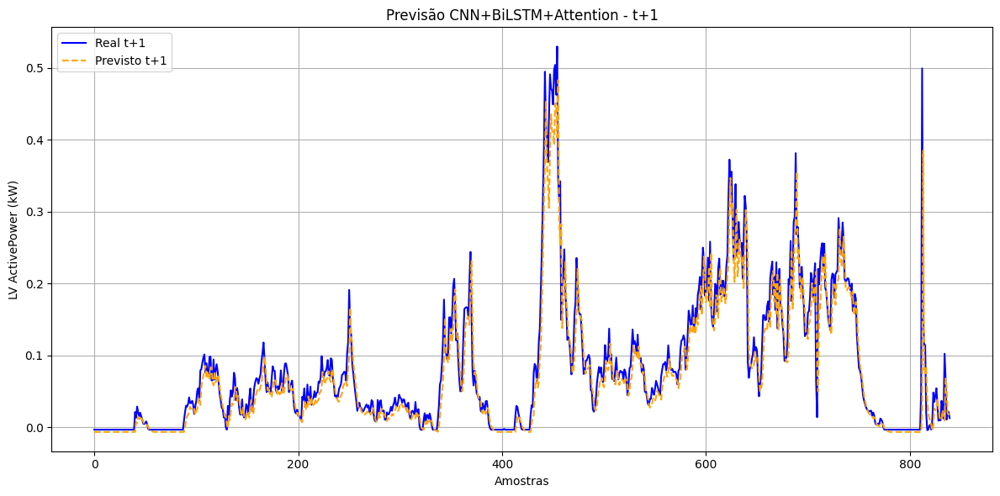

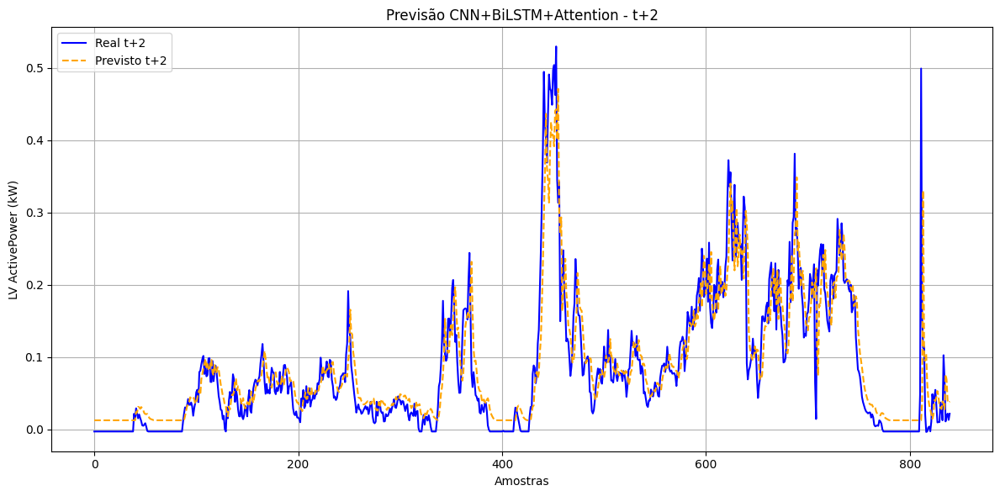

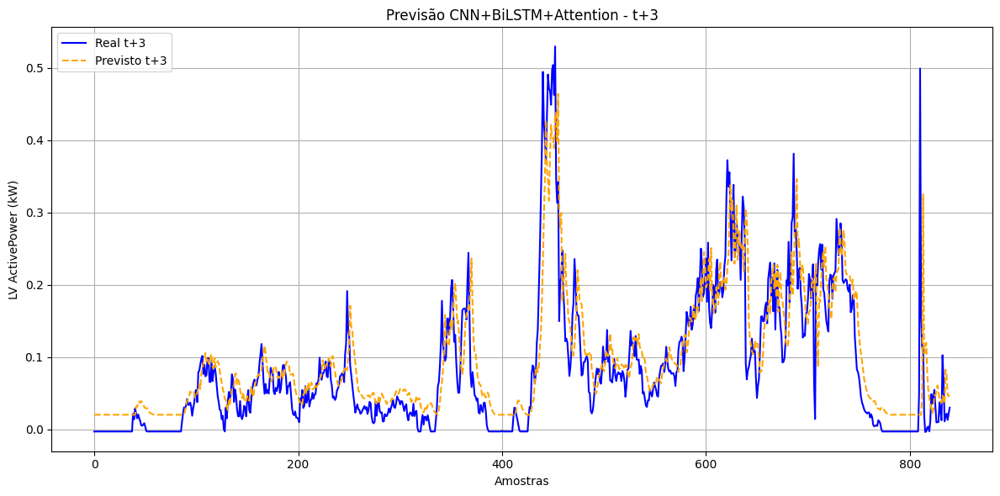

{'Horizonte t+1': {'MAPE': 1.8953985823520356,
  'RMSE': 0.03472872040399184,
  'MAE': 0.019515023803896556},
 'Horizonte t+2': {'MAPE': 2.652112988266814,
  'RMSE': 0.042296876659418295,
  'MAE': 0.027306155327195113},
 'Horizonte t+3': {'MAPE': 3.311561234585589,
  'RMSE': 0.04924562795513487,
  'MAE': 0.03409583447129322}}

In [12]:
cnn_bilstm_att_model(new_data,i,look_back,data_partition,cap)

In [ ]:
cnn_bilstm_att_model_with_optuna(new_data,i,look_back,data_partition,cap)

[I 2025-09-10 10:21:29,207] A new study created in memory with name: no-name-2a693072-11f0-4107-af03-aa70ff4e30f7


  0%|          | 0/30 [00:00<?, ?it/s]

27/27 [==============================] - 3s 15ms/step
[I 2025-09-10 10:24:01,520] Trial 5 finished with value: 9.778424843516055 and parameters: {'filters': 32, 'kernel_size': 2, 'neuron': 64, 'dropout': 0.023026967684320665, 'lr': 0.0006297206785311925, 'batch_size': 64}. Best is trial 5 with value: 9.778424843516055.
27/27 [==============================] - 3s 13ms/step
[I 2025-09-10 10:24:02,607] Trial 4 finished with value: 8.38719027372238 and parameters: {'filters': 64, 'kernel_size': 2, 'neuron': 64, 'dropout': 0.08030400313880015, 'lr': 0.0018677629939708768, 'batch_size': 64}. Best is trial 4 with value: 8.38719027372238.
27/27 [==============================] - 2s 7ms/step
[I 2025-09-10 10:24:34,355] Trial 1 finished with value: 8.244922521109274 and parameters: {'filters': 16, 'kernel_size': 3, 'neuron': 16, 'dropout': 0.22106112971694175, 'lr': 0.003467624912897851, 'batch_size': 32}. Best is trial 1 with value: 8.244922521109274.
27/27 [==============================] - 5s

164/164 [==============================] - 1s 5ms/step
MAPE por horizonte: [6.622816510256883, 7.494366121463279, 8.22203515268525]
RMSE por horizonte: [0.10955263064584511, 0.12252129064393236, 0.1317577073721947]
MAE por horizonte: [0.06818851878960488, 0.07716199358658593, 0.08465407393204732]
MAPE médio: 7.446405928135138


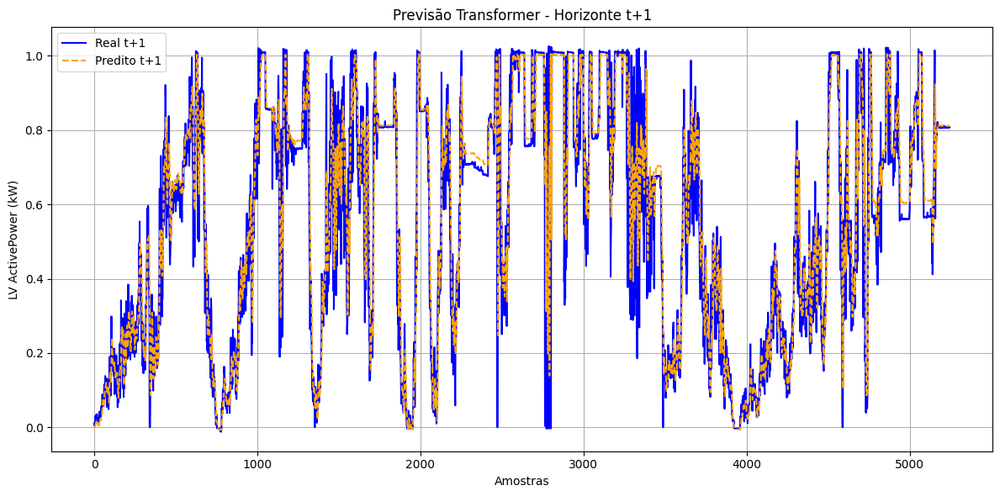

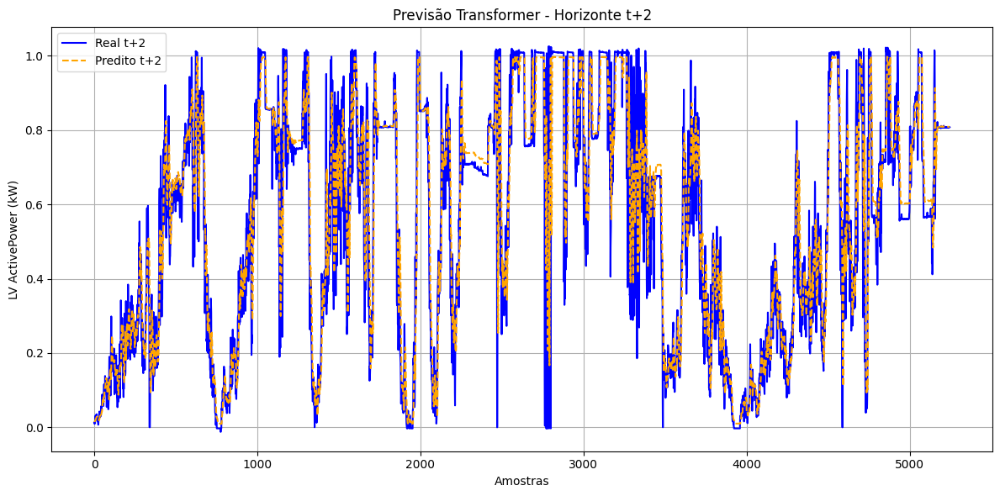

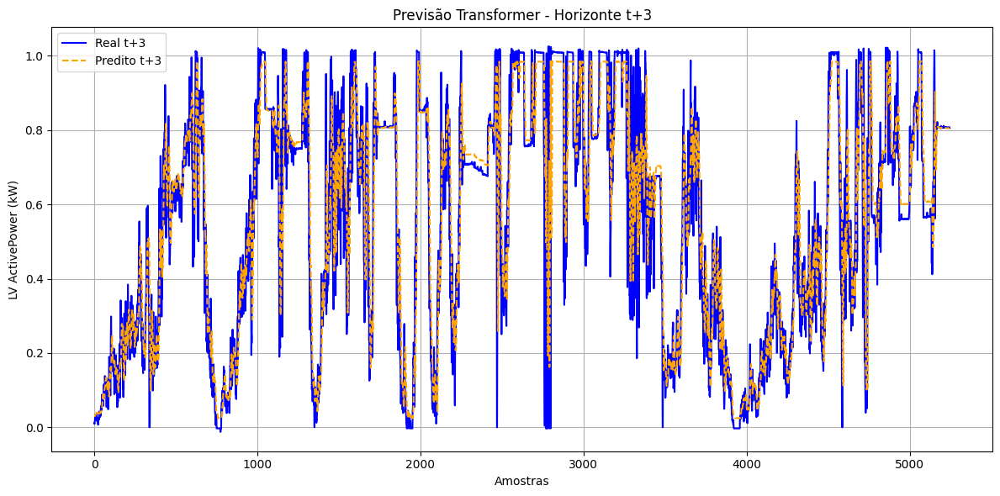

{'MAPE por horizonte': [6.622816510256883,
  7.494366121463279,
  8.22203515268525],
 'RMSE por horizonte': [0.10955263064584511,
  0.12252129064393236,
  0.1317577073721947],
 'MAE por horizonte': [0.06818851878960488,
  0.07716199358658593,
  0.08465407393204732],
 'MAPE médio': 7.446405928135138}

In [29]:
transformer_model(new_data,i,look_back,data_partition,cap)

Iniciando preparação dos dados multivariados (fluxo corrigido)...
Construindo e treinando o modelo TFT multivariado...
Realizando previsões...
83/83 [==============================] - 1s 6ms/step

===== Métricas Completas (baseadas na previsão da mediana q=0.5) =====
Horizonte t+1: MAPE=4.8347%, RMSE=0.0820, MAE=0.0498, R²=0.9402
Horizonte t+2: MAPE=6.5138%, RMSE=0.1112, MAE=0.0671, R²=0.8902
Horizonte t+3: MAPE=7.6326%, RMSE=0.1261, MAE=0.0786, R²=0.8588


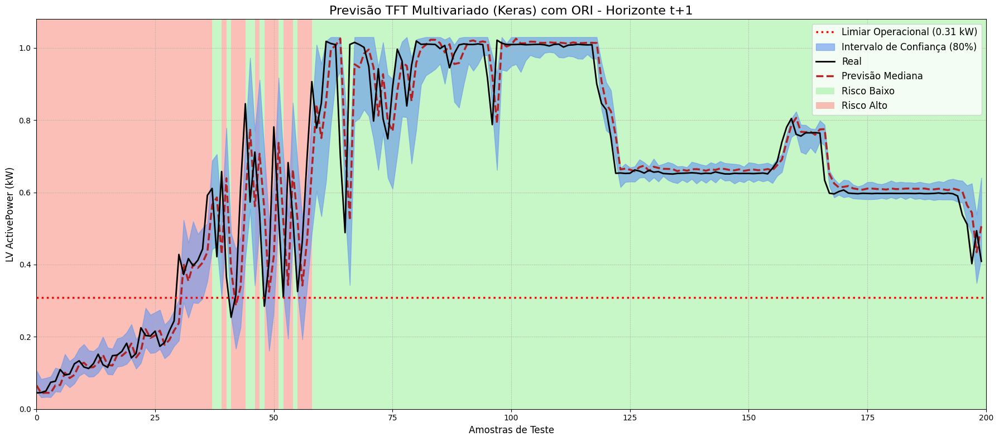

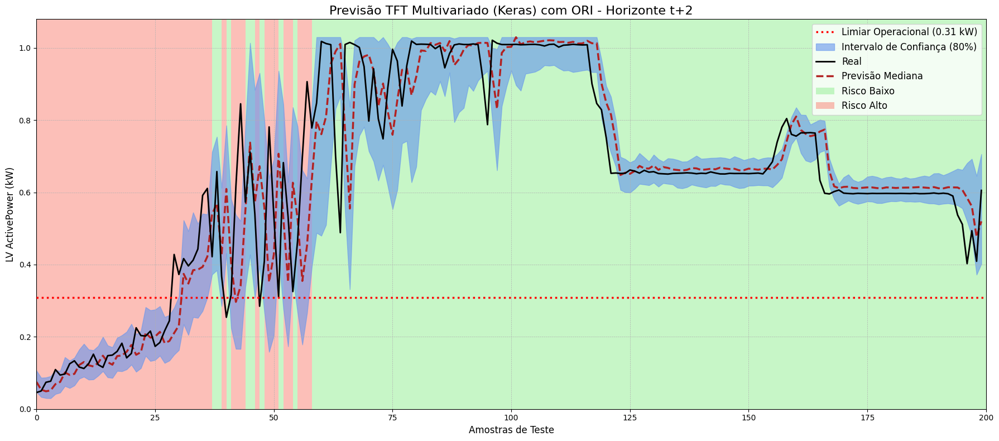

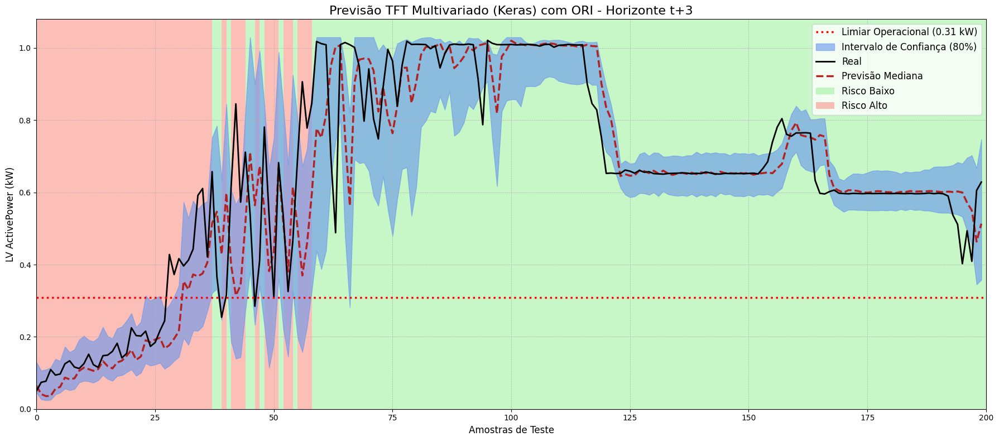

{0.1: array([[0.04895108, 0.0473642 , 0.04524138],
        [0.03212854, 0.03323691, 0.0271002 ],
        [0.03347715, 0.030328  , 0.02408724],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ]], dtype=float32),
 0.5: array([[0.06566604, 0.07507258, 0.06423407],
        [0.04414552, 0.05368509, 0.04136267],
        [0.04507952, 0.04903647, 0.03578999],
        ...,
        [0.        , 0.        , 0.        ],
        [0.        , 0.        , 0.        ],
        [0.        , 0.00328644, 0.        ]], dtype=float32),
 0.9: array([[0.106635  , 0.10645529, 0.12952207],
        [0.08307087, 0.08654919, 0.10653802],
        [0.08597975, 0.08725887, 0.10934191],
        ...,
        [0.01824044, 0.00618266, 0.02828731],
        [0.02142566, 0.00924843, 0.03077462],
        [0.03059857, 0.01940348, 0.0452831 ]], dtype=float32)}

In [37]:
tft_model(new_data,i,look_back,data_partition,cap)

Iniciando decomposição do sinal (CEEMDAN + EWT)...
--- Q0.1 | Treinando LSTM para: imf_denoised ---
--- Q0.1 | Treinando LSTM para: imf_1 ---
--- Q0.1 | Treinando LSTM para: imf_2 ---
--- Q0.1 | Treinando LSTM para: imf_3 ---
--- Q0.1 | Treinando LSTM para: imf_4 ---
--- Q0.1 | Treinando LSTM para: imf_5 ---
--- Q0.1 | Treinando LSTM para: imf_6 ---
--- Q0.1 | Treinando LSTM para: imf_7 ---
--- Q0.1 | Treinando LSTM para: imf_8 ---
--- Q0.1 | Treinando LSTM para: imf_9 ---
--- Q0.1 | Treinando LSTM para: imf_10 ---
--- Q0.1 | Treinando LSTM para: imf_11 ---
--- Q0.5 | Treinando LSTM para: imf_denoised ---
--- Q0.5 | Treinando LSTM para: imf_1 ---
--- Q0.5 | Treinando LSTM para: imf_2 ---
--- Q0.5 | Treinando LSTM para: imf_3 ---
--- Q0.5 | Treinando LSTM para: imf_4 ---
--- Q0.5 | Treinando LSTM para: imf_5 ---
--- Q0.5 | Treinando LSTM para: imf_6 ---
--- Q0.5 | Treinando LSTM para: imf_7 ---
--- Q0.5 | Treinando LSTM para: imf_8 ---
--- Q0.5 | Treinando LSTM para: imf_9 ---
--- Q0.5 

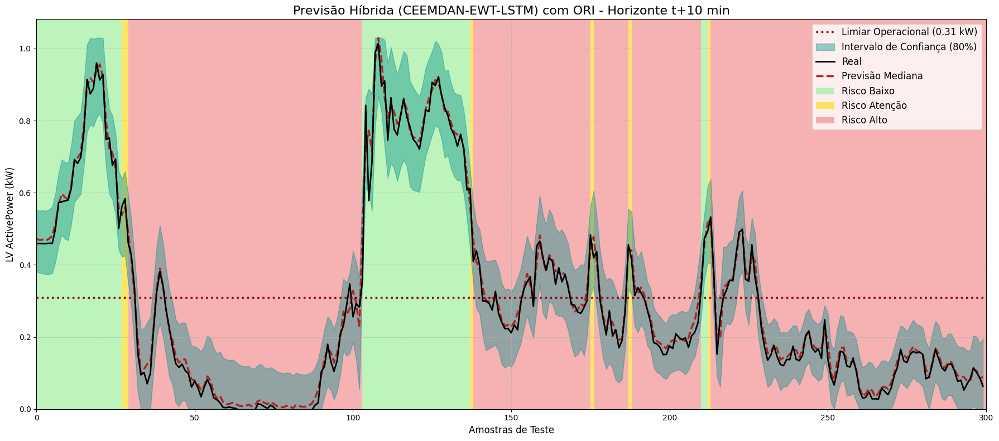

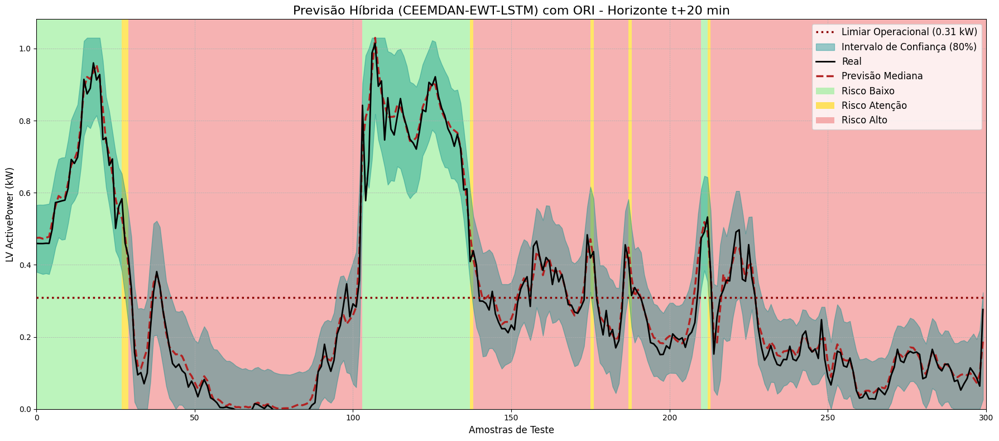

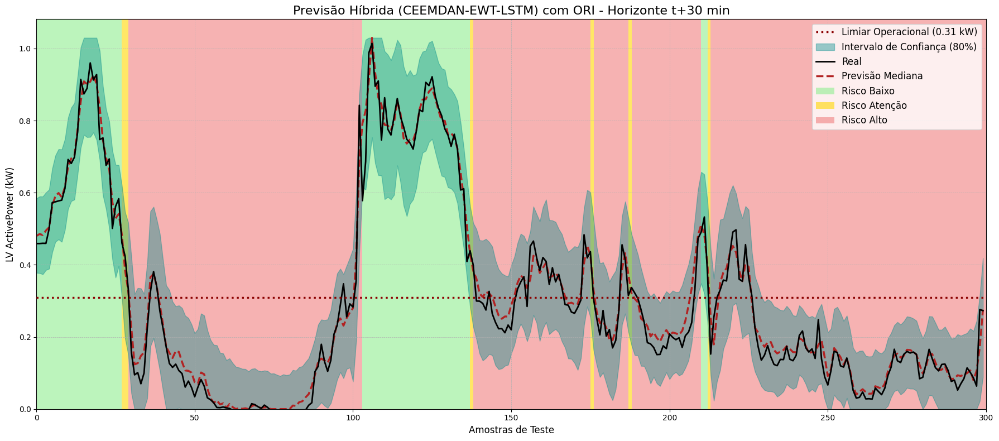

({0.1: array([[0.38183802, 0.38033387, 0.37759748],
         [0.37694785, 0.37718162, 0.3770409 ],
         [0.37673497, 0.37417352, 0.3736315 ],
         ...,
         [0.34313735, 0.2246167 , 0.18277231],
         [0.27643988, 0.19513386, 0.19619519],
         [0.23060127, 0.20200077, 0.21606389]], dtype=float32),
  0.5: array([[0.47198835, 0.47462794, 0.48014247],
         [0.46863443, 0.4752688 , 0.48533025],
         [0.4699376 , 0.47238788, 0.48250896],
         ...,
         [0.48833087, 0.40229273, 0.36781403],
         [0.41721487, 0.35924917, 0.37028658],
         [0.37014914, 0.3627869 , 0.3984951 ]], dtype=float32),
  0.9: array([[0.55277085, 0.5657887 , 0.58394897],
         [0.54959655, 0.56658256, 0.5895447 ],
         [0.55173546, 0.5663788 , 0.58943474],
         ...,
         [0.62299037, 0.58815324, 0.58297163],
         [0.552047  , 0.53726804, 0.57666427],
         [0.5064488 , 0.53654426, 0.5912866 ]], dtype=float32)},
 array([[0.45906, 0.45924, 0.45894],
        

In [13]:
proposed_method(new_data,i,look_back,data_partition,cap)

Iniciando decomposição do sinal com CEEMDAN-EWT...
Iniciando preparação dos dados para o TFT Agregador...
Construindo e treinando o modelo (CEEMDAN-EWT)-TFT...
Realizando previsões...
83/83 [==============================] - 1s 4ms/step

===== Métricas Completas (baseadas na previsão da mediana q=0.5) =====
Horizonte t+1: MAPE=3.0174%, RMSE=0.0432, MAE=0.0311, R²=0.9834
Horizonte t+2: MAPE=3.5688%, RMSE=0.0527, MAE=0.0367, R²=0.9753
Horizonte t+3: MAPE=3.9840%, RMSE=0.0585, MAE=0.0410, R²=0.9696


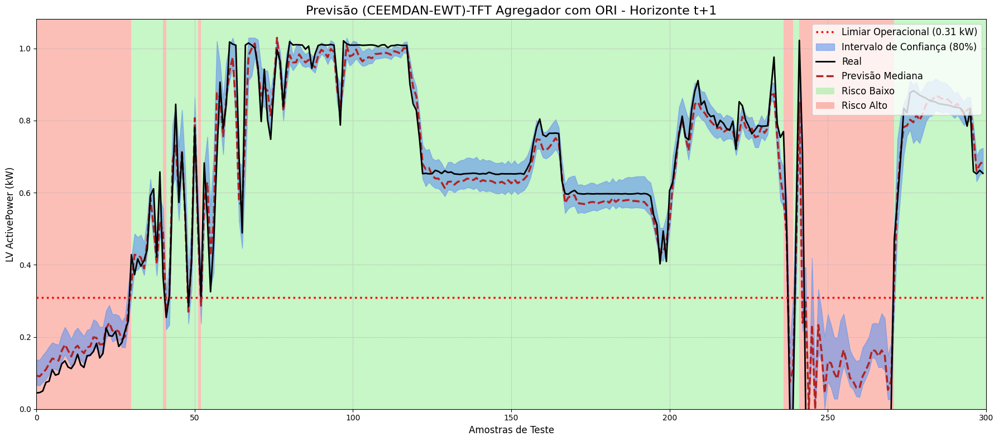

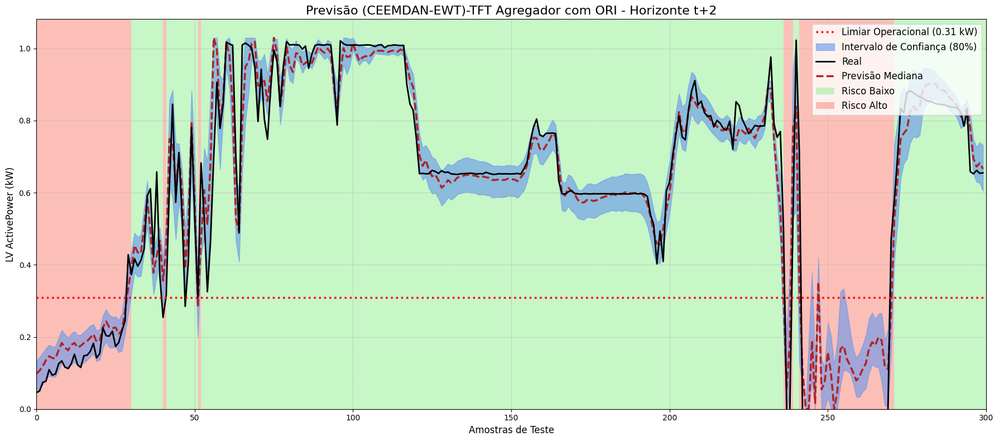

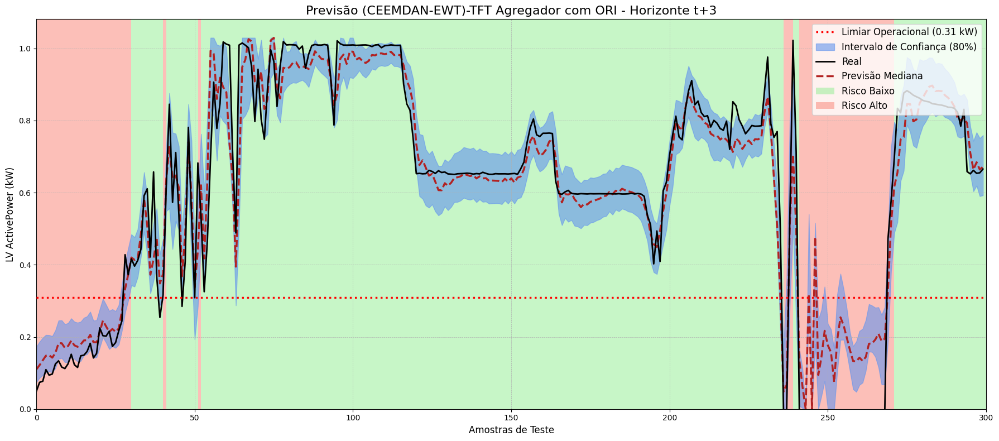

{0.1: array([[0.06657176, 0.04742836, 0.07474037],
        [0.06491249, 0.05572315, 0.08647364],
        [0.07473259, 0.06718533, 0.09402411],
        ...,
        [0.        , 0.        , 0.0127834 ],
        [0.00466215, 0.02201273, 0.03346982],
        [0.03584331, 0.03566145, 0.03129106]], dtype=float32),
 0.5: array([[0.09258407, 0.09803011, 0.11002817],
        [0.09040263, 0.10653054, 0.1218132 ],
        [0.09997558, 0.11885383, 0.13510244],
        ...,
        [0.01693156, 0.02331694, 0.03612869],
        [0.0249491 , 0.05064305, 0.05864277],
        [0.05679815, 0.06525316, 0.05507671]], dtype=float32),
 0.9: array([[0.13645957, 0.13311695, 0.17305605],
        [0.13627265, 0.14386491, 0.1865867 ],
        [0.14927019, 0.156065  , 0.1974952 ],
        ...,
        [0.04732435, 0.04039788, 0.06305786],
        [0.05576261, 0.06913155, 0.0872859 ],
        [0.08807956, 0.08573418, 0.08554622]], dtype=float32)}

In [39]:
proposed_method_tft_aggregator(new_data,i,look_back,data_partition,cap)

MAPE 1.4638312550075445
RMSE 0.02052169166641641
MAE 0.015071606601557682


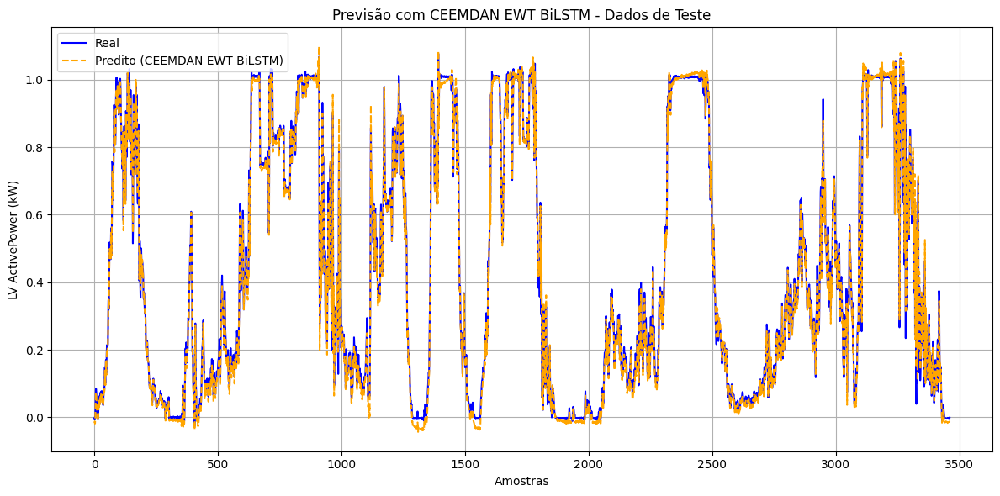

In [13]:
proposed_method_bilstm(new_data,i,look_back,data_partition,cap)

MAPE 1.2730662980606802
RMSE 0.02040102740665386
MAE 0.013107490604832761


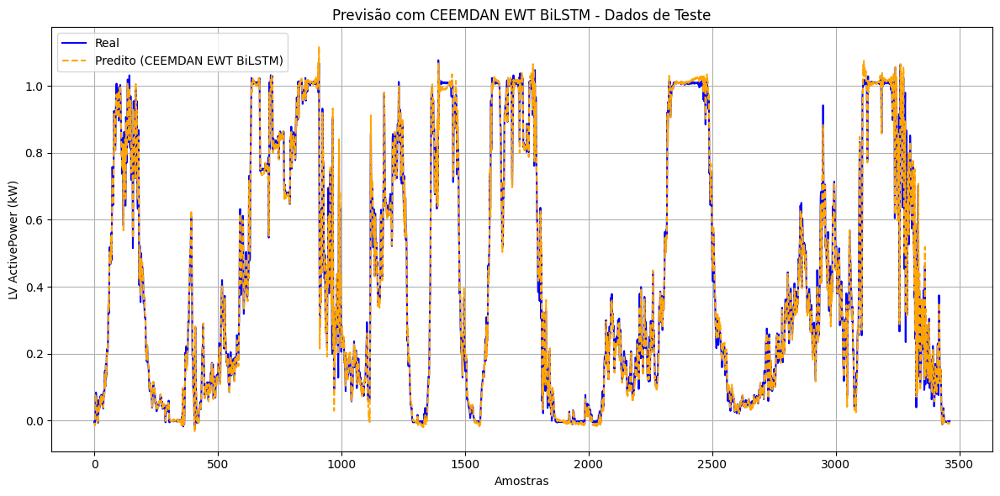

In [14]:
proposed_method_bilstm_att(new_data,i,look_back,data_partition,cap)

MAPE 1.3140214877172287
RMSE 0.01938591702349144
MAE 0.013529165237536587


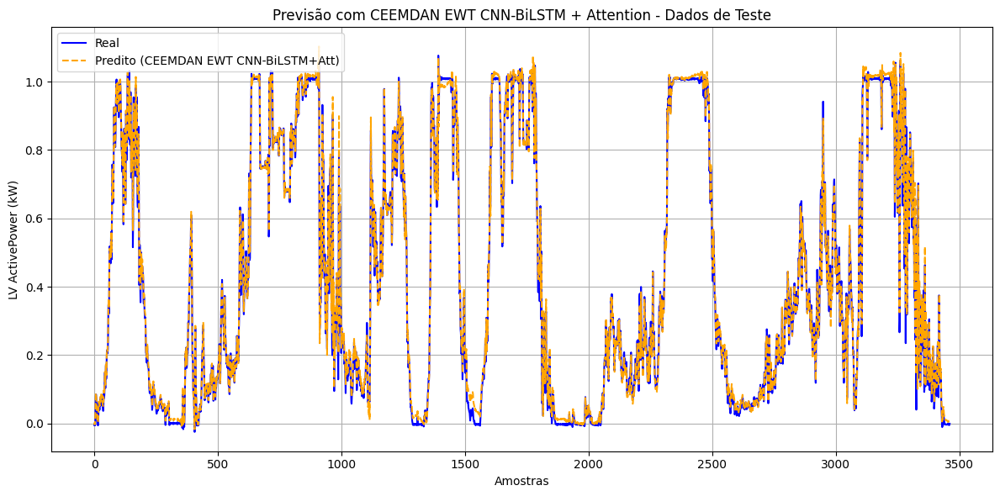

In [16]:
proposed_method_cnn_bilstm(new_data,i,look_back,data_partition,cap)

MAPE 2.101107642120501
RMSE 0.02900865347775173
MAE 0.021633004283272677


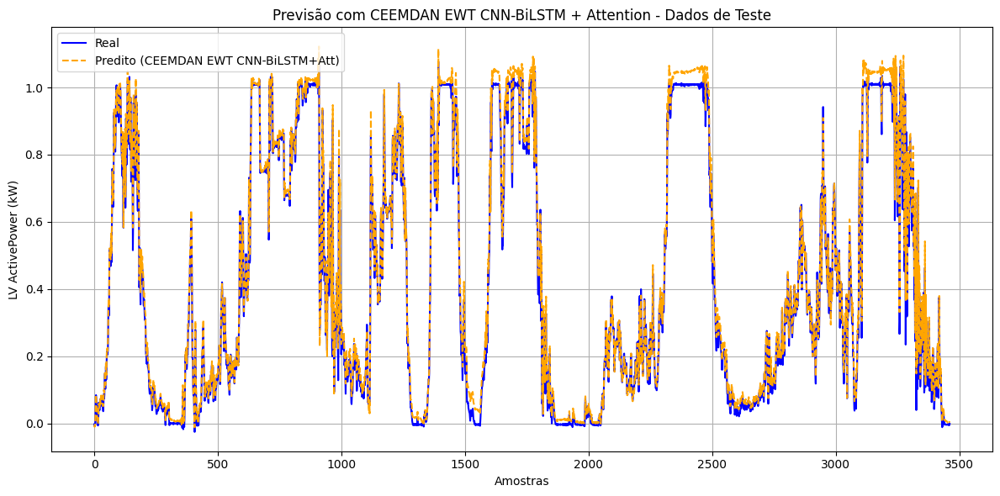

In [17]:
proposed_method_cnn_bilstm_att(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_lstm_optuna(new_data,i,look_back,data_partition,cap)

[I 2025-08-21 13:21:35,917] A new study created in memory with name: no-name-815516be-66ce-4c4f-9aa2-079f1b4c37fa


  0%|          | 0/20 [00:00<?, ?it/s]

[I 2025-08-21 13:58:37,656] Trial 0 finished with value: 2.8265673420150272 and parameters: {'lstm_units': 32, 'dropout': 0.4852650290539918, 'lr': 0.0010676260610853687, 'batch_size': 16}. Best is trial 0 with value: 2.8265673420150272.


In [ ]:
proposed_method_bilstm_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_bilstm_att_optuna(new_data,i,look_back,data_partition,cap)

In [45]:
proposed_method_cnn_bilstm_att_optuna(new_data,i,look_back,data_partition,cap)

NameError: name 'proposed_method_cnn_bilstm_att_optuna' is not defined